In [1]:
import sys
sys.path.insert(0, 'C:/Users/14432/OneDrive/Research/Projects/a549_pcna/scripts/4_wk_trajectory/')
sys.path.insert(1, 'C:/Users/14432/OneDrive/Research/Projects/a549_pcna/scripts/memes/')

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import pickle
from PIL import Image, ImageDraw, ImageFont

from matplotlib import animation
from matplotlib import cm
from matplotlib import pyplot as plt

import os
from os import listdir

import scipy.io as sio
import scipy.misc
import scipy.ndimage as ndimage
from scipy.signal import medfilt,find_peaks
from scipy.stats import kde
import scipy.interpolate.fitpack as fitpack

from skimage.feature import peak_local_max
from skimage import measure
from skimage.measure import regionprops, label
from skimage.morphology import opening, closing, remove_small_holes, remove_small_objects, \
                               local_maxima, h_maxima, disk, dilation
from skimage.io import imread
from skimage.segmentation import find_boundaries

from sklearn import manifold,decomposition,random_projection,cluster,metrics,preprocessing,mixture,model_selection
from sklearn.neighbors import KernelDensity
from sklearn.preprocessing import StandardScaler

from cell_class import single_cell,fluor_single_cell
import image_warp
from contour_tool import df_find_contour_points,find_contour_points,generate_contours,align_contour_to,align_contours
import utility_tools
from skimage.filters.rank import otsu
import contour_class
from traj_class import single_cell_traj,fluor_single_cell_traj
import matplotlib.animation as animation

from traj_tools import generate_single_cell_img,find_mother,find_mother_label,find_offspring,parse,find_abnormal_fluor,\
    count_num_fluor_pca_cord

In [2]:
def generate_fluor_long_traj(df,cells,am_record,traj_df,traj,fluor_name,feature_list,fluor_feature_name):
    
    haralick_labels = ["Angular Second Moment",
                   "Contrast",
                   "Correlation",
                   "Sum of Squares: Variance",
                   "Inverse Difference Moment",
                   "Sum Average",
                   "Sum Variance",
                   "Sum Entropy",
                   "Entropy",
                   "Difference Variance",
                   "Difference Entropy",
                   "Information Measure of Correlation 1",
                   "Information Measure of Correlation 2",
                    "Maximal Correlation Coefficient"]
    
    
    traj_record=pd.DataFrame(traj_df.loc[:,'1':str(time_span)])
    traj_record=traj_record.values
    traj_quan,traj_len=traj_record.shape[0],traj_record.shape[1]
    
    traj_xy=[]
    traj_feature=[]
    traj_contour=[]
    traj_cord=[]
    traj_seri=[]
    traj_am_flag=[]
 
    traj_vim_feature_values=[]
    traj_vim_haralick=[]
    traj_vim_norm_haralick=[]
    traj_vim_pca_cord=[]
    
    traj_pcna_feature_values=[]
    traj_pcna_haralick=[]
    traj_pcna_norm_haralick=[]
    traj_pcna_pca_cord=[]

    num_vim_pca_cord=count_num_fluor_pca_cord(cells,fluor_name[0],fluor_feature_name[:2])
    num_pcna_pca_cord=count_num_fluor_pca_cord(cells,fluor_name[1],fluor_feature_name[2:])
    
    for img_num in range(1,traj_len+1):
        obj_num=traj[img_num-1]
        if obj_num!=-1:
            ind=df.loc[(df['ImageNumber']==img_num)&(df['ObjectNumber']==obj_num)].index.tolist()[0]

            if hasattr(cells[ind],fluor_name[0]+'_feature_values') and \
                hasattr(cells[ind],fluor_name[1]+'_feature_values'):
                
                cell_pcna_feature_values = cells[ind].pcna_feature_values[3]
                num_zero_haralick = sum(x==0 for x in cell_pcna_feature_values)

                if num_zero_haralick != len(cell_pcna_feature_values):
            
                    if hasattr(cells[ind],'cell_contour') and hasattr(cells[ind],'pca_cord'):
                        traj_contour.append(cells[ind].cell_contour.points.flatten())
                        traj_cord.append(cells[ind].pca_cord)
                        traj_seri.append([img_num,obj_num])
                        traj_xy.append([df.loc[ind,'Cell_AreaShape_Center_X'],df.loc[ind,'Cell_AreaShape_Center_Y']])
                        traj_feature.append(df.loc[ind,'Cell_AreaShape_Area':'Cell_AreaShape_Solidity'].values.tolist())

                        if ((am_record['ImageNumber']==img_num)&(am_record['ObjectNumber']==obj_num)).any():
                            am_flag=np.asscalar(am_record.loc[(am_record['ImageNumber']==img_num)&\
                                                              (am_record['ObjectNumber']==obj_num),'am_flag'].values)
                            traj_am_flag.append(am_flag)
                        else:
                            traj_am_flag.append(0)

                        exec('traj_vim_feature_values.append(np.array(cells[ind].'+fluor_name[0]+'_feature_values[:3]))')
                        exec('traj_vim_haralick.append(np.array(cells[ind].'+fluor_name[0]+'_feature_values[3]))')
                        exec('traj_vim_norm_haralick.append(np.array(cells[ind].'+fluor_name[0]+'_feature_values[4]))')
                        exec('traj_vim_pca_cord.append(cells[ind].'+fluor_feature_name[0]+'_pca_cord)')

                        exec('traj_pcna_feature_values.append(np.array(cells[ind].'+fluor_name[1]+'_feature_values[:3]))')
                        exec('traj_pcna_haralick.append(np.array(cells[ind].'+fluor_name[1]+'_feature_values[3]))')
                        exec('traj_pcna_norm_haralick.append(np.array(cells[ind].'+fluor_name[1]+'_feature_values[4]))')
                        exec('traj_pcna_pca_cord.append(cells[ind].'+fluor_feature_name[1]+'_pca_cord)')
    
    traj_xy=np.asarray(traj_xy)
    traj_feature=np.asarray(traj_feature)
    traj_contour=np.asarray(traj_contour)
    traj_cord=np.asarray(traj_cord)
    traj_seri=np.asarray(traj_seri)
    
    traj_am_flag=np.asarray(traj_am_flag)
    
    traj_vim_feature_values=np.asarray(traj_vim_feature_values)
    traj_vim_haralick=np.asarray(traj_vim_haralick)
    traj_vim_norm_haralick=np.asarray(traj_vim_norm_haralick)
    traj_vim_pca_cord=np.asarray(traj_vim_pca_cord)  
    
    traj_pcna_feature_values=np.asarray(traj_pcna_feature_values)
    traj_pcna_haralick=np.asarray(traj_pcna_haralick)
    traj_pcna_norm_haralick=np.asarray(traj_pcna_norm_haralick)
    traj_pcna_pca_cord=np.asarray(traj_pcna_pca_cord)  
   
#     mask=traj_fluor_feature_values[:,0]!=0
    
        
#     abn_inds=find_abnormal_fluor(traj_vim_feature_values[:,0],traj_seri[:,0])
#     if len(abn_inds)>0:
#         traj_vim_feature_values[abn_inds,:]=0
#         traj_vim_haralick[abn_inds,:]=0
#         traj_vim_norm_haralick[abn_inds,:]=0
#         print(traj_vim_pca_cord.shape)
#         traj_vim_pca_cord[abn_inds,:]=0
    if len(traj_pcna_feature_values) > 0:
        return traj_feature,traj_contour,traj_cord,traj_seri,traj_am_flag,\
               [traj_vim_feature_values[:,0],traj_vim_feature_values[:,1],traj_vim_feature_values[:,2],\
               traj_vim_haralick,traj_vim_norm_haralick],traj_vim_pca_cord,\
               [traj_pcna_feature_values[:,0],traj_pcna_feature_values[:,1],traj_pcna_feature_values[:,2],\
               traj_pcna_haralick,traj_pcna_norm_haralick],traj_pcna_pca_cord
    else:
        return traj_feature,traj_contour,traj_cord,traj_seri,traj_am_flag,\
               traj_vim_feature_values,traj_vim_pca_cord,\
               traj_pcna_feature_values,traj_pcna_pca_cord


In [3]:
main_path='C:/Users/14432/OneDrive/Research/Projects/a549_pcna/data/'
output_path=main_path+'out/11-2-21_mt_20E-3_lt_35E-2/'
sct_path=output_path+'sct/'
cell_ani_path=output_path+'cell_ani/'
cell_nuc_ani_path=output_path+'cell_nuc_ani/'
if not os.path.exists(sct_path):
    os.makedirs(sct_path)
if not os.path.exists(cell_ani_path):
    os.makedirs(cell_ani_path)
if not os.path.exists(cell_nuc_ani_path):
    os.makedirs(cell_nuc_ani_path)
    
posi_end=3
time_span=1729
traj_len_thres=144

loss_ratio_thres=0.5

feature_list=['mean_intensity','std_intensity','intensity_range','haralick','norm_haralick']
fluor_feature_name=['vimentin_haralick','pcna_haralick']

1
family {}
all branch [[1]]
2
family {}
all branch [[2]]
3
family {}
all branch [[3]]
this cell has pca cord
6
this cell has pca cord
6
4
family {4: [15, 16]}
all branch [[4, 15], [4, 16]]
this cell has pca cord
6
this cell has pca cord
6
5
family {}
all branch [[5]]
6
family {}
all branch [[6]]
7
family {7: [100, 101]}
all branch [[7, 100], [7, 101]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
8
family {}
all branch [[8]]
9
family {}
all branch [[9]]
10
family {}
all branch [[10]]
11
family {11: [37, 38]}
all branch [[11, 37], [11, 38]]
12
family {12: [58, 57]}
all branch [[12, 58], [12, 57]]
13
family {13: [48, 49]}
all branch [[13, 48], [13, 49]]
this cell has pca cord
6
this cell has pca cord
6
14
family {}
all branch [[14]]
15
family {}
all branch [[15]]
this cell has pca cord
6
this cell has pca cord
6
16
family {}
all branch [[16]]
17
family {17: [39, 40], 40: [176, 177]}
all branch [[17, 39], [17, 40, 176], [17, 40, 177]]

this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
279
family {}
all branch [[279]]
280
family {}
all branch [[280]]
281
family {}
all branch [[281]]
282
family {}
all branch [[282]]
283
family {}
all branch [[283]]
this cell has pca cord
6
this cell has pca cord
6
284
family {}
all branch [[284]]
285
family {}
all branch [[285]]
286
family {}
all branch [[286]]
287
family {}
all branch [[287]]
288
family {}
all branch [[288]]
289
family {}
all branch [[289]]
290
family {}
all branch [[290]]
291
family {}
all branch [[291]]
292
family {}
all branch [[292]]
293
family {}
all branch [[293]]
294
family {}
all branch [[294]]
295
family {}
all branch [[295]]
296
family {}
all branch [[296]]
297
family {}
all branch [[297]]
298
family {}
all branch [[298]]
299
family {}
all branch [[299]]
300
fam

511
family {511: [608, 609]}
all branch [[511, 608], [511, 609]]
512
family {512: [574, 573], 573: [664, 665]}
all branch [[512, 574], [512, 573, 664], [512, 573, 665]]
this cell has pca cord
6
this cell has pca cord
6
513
family {}
all branch [[513]]
514
family {}
all branch [[514]]
515
family {}
all branch [[515]]
516
family {}
all branch [[516]]
517
family {}
all branch [[517]]
518
family {}
all branch [[518]]
519
family {}
all branch [[519]]
520
family {}
all branch [[520]]
521
family {}
all branch [[521]]
522
family {}
all branch [[522]]
523
family {}
all branch [[523]]
524
family {}
all branch [[524]]
525
family {}
all branch [[525]]
526
family {}
all branch [[526]]
527
family {}
all branch [[527]]
528
family {528: [750, 751]}
all branch [[528, 750], [528, 751]]
529
family {}
all branch [[529]]
530
family {}
all branch [[530]]
531
family {}
all branch [[531]]
532
family {}
all branch [[532]]
533
family {}
all branch [[533]]
534
family {}
all branch [[534]]
535
family {}
all branc

762
family {}
all branch [[762]]
763
family {}
all branch [[763]]
764
family {}
all branch [[764]]
765
family {}
all branch [[765]]
766
family {}
all branch [[766]]
767
family {}
all branch [[767]]
768
family {}
all branch [[768]]
769
family {}
all branch [[769]]
770
family {}
all branch [[770]]
771
family {}
all branch [[771]]
772
family {}
all branch [[772]]
773
family {}
all branch [[773]]
774
family {}
all branch [[774]]
this cell has pca cord
6
this cell has pca cord
6
775
family {}
all branch [[775]]
776
family {}
all branch [[776]]
777
family {}
all branch [[777]]
778
family {}
all branch [[778]]
779
family {}
all branch [[779]]
780
family {}
all branch [[780]]
781
family {}
all branch [[781]]
782
family {}
all branch [[782]]
783
family {}
all branch [[783]]
784
family {}
all branch [[784]]
785
family {}
all branch [[785]]
786
family {}
all branch [[786]]
787
family {}
all branch [[787]]
788
family {}
all branch [[788]]
789
family {}
all branch [[789]]
790
family {}
all branch [

1028
family {}
all branch [[1028]]
1029
family {}
all branch [[1029]]
1030
family {}
all branch [[1030]]
1031
family {}
all branch [[1031]]
1032
family {}
all branch [[1032]]
1033
family {}
all branch [[1033]]
1034
family {}
all branch [[1034]]
1035
family {}
all branch [[1035]]
1036
family {}
all branch [[1036]]
1037
family {}
all branch [[1037]]
1038
family {}
all branch [[1038]]
1039
family {}
all branch [[1039]]
1040
family {}
all branch [[1040]]
1041
family {}
all branch [[1041]]
1042
family {}
all branch [[1042]]
1043
family {}
all branch [[1043]]
1044
family {}
all branch [[1044]]
this cell has pca cord
6
this cell has pca cord
6
1045
family {}
all branch [[1045]]
this cell has pca cord
6
this cell has pca cord
6
1046
family {}
all branch [[1046]]
1047
family {}
all branch [[1047]]
1048
family {}
all branch [[1048]]
1049
family {}
all branch [[1049]]
1050
family {}
all branch [[1050]]
1051
family {}
all branch [[1051]]
1052
family {}
all branch [[1052]]
1053
family {}
all branch

1287
family {}
all branch [[1287]]
1288
family {}
all branch [[1288]]
1289
family {}
all branch [[1289]]
1290
family {}
all branch [[1290]]
1291
family {}
all branch [[1291]]
1292
family {}
all branch [[1292]]
1293
family {}
all branch [[1293]]
1294
family {}
all branch [[1294]]
1295
family {}
all branch [[1295]]
1296
family {}
all branch [[1296]]
1297
family {}
all branch [[1297]]
1298
family {}
all branch [[1298]]
1299
family {}
all branch [[1299]]
1300
family {}
all branch [[1300]]
this cell has pca cord
6
this cell has pca cord
6
1301
family {}
all branch [[1301]]
1302
family {}
all branch [[1302]]
1303
family {1303: [1463, 1462]}
all branch [[1303, 1463], [1303, 1462]]
1304
family {}
all branch [[1304]]
1305
family {}
all branch [[1305]]
1306
family {}
all branch [[1306]]
1307
family {}
all branch [[1307]]
1308
family {}
all branch [[1308]]
1309
family {}
all branch [[1309]]
1310
family {}
all branch [[1310]]
1311
family {}
all branch [[1311]]
1312
family {}
all branch [[1312]]
13

family {}
all branch [[1512]]
1513
family {}
all branch [[1513]]
1514
family {}
all branch [[1514]]
1515
family {}
all branch [[1515]]
1516
family {}
all branch [[1516]]
1517
family {}
all branch [[1517]]
1518
family {}
all branch [[1518]]
1519
family {}
all branch [[1519]]
1520
family {}
all branch [[1520]]
1521
family {}
all branch [[1521]]
1522
family {}
all branch [[1522]]
1523
family {}
all branch [[1523]]
1524
family {}
all branch [[1524]]
1525
family {}
all branch [[1525]]
1526
family {}
all branch [[1526]]
1527
family {1527: [2674, 2675]}
all branch [[1527, 2674], [1527, 2675]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
1528
family {}
all branch [[1528]]
1529
family {}
all branch [[1529]]
1530
family {}
all branch [[1530]]
1531
family {}
all branch [[1531]]
1532
family {}
all branch [[1532]]
1533
family {}
all branch [[1533]]
1534
family {}
all branch [[1534]]
1535
family 

1728
family {}
all branch [[1728]]
1729
family {}
all branch [[1729]]
1730
family {}
all branch [[1730]]
1731
family {}
all branch [[1731]]
1732
family {}
all branch [[1732]]
1733
family {}
all branch [[1733]]
1734
family {}
all branch [[1734]]
1735
family {}
all branch [[1735]]
1736
family {}
all branch [[1736]]
1737
family {}
all branch [[1737]]
1738
family {}
all branch [[1738]]
1739
family {}
all branch [[1739]]
1740
family {}
all branch [[1740]]
1741
family {}
all branch [[1741]]
1742
family {}
all branch [[1742]]
1743
family {}
all branch [[1743]]
1744
family {}
all branch [[1744]]
1745
family {}
all branch [[1745]]
1746
family {}
all branch [[1746]]
1747
family {}
all branch [[1747]]
1748
family {}
all branch [[1748]]
1749
family {}
all branch [[1749]]
1750
family {}
all branch [[1750]]
1751
family {}
all branch [[1751]]
1752
family {}
all branch [[1752]]
1753
family {}
all branch [[1753]]
1754
family {}
all branch [[1754]]
1755
family {}
all branch [[1755]]
1756
family {}
all b

1978
family {}
all branch [[1978]]
1979
family {}
all branch [[1979]]
1980
family {}
all branch [[1980]]
1981
family {}
all branch [[1981]]
1982
family {}
all branch [[1982]]
1983
family {}
all branch [[1983]]
1984
family {}
all branch [[1984]]
1985
family {}
all branch [[1985]]
1986
family {}
all branch [[1986]]
1987
family {}
all branch [[1987]]
1988
family {}
all branch [[1988]]
1989
family {}
all branch [[1989]]
1990
family {}
all branch [[1990]]
1991
family {}
all branch [[1991]]
1992
family {}
all branch [[1992]]
1993
family {}
all branch [[1993]]
1994
family {}
all branch [[1994]]
1995
family {}
all branch [[1995]]
1996
family {}
all branch [[1996]]
1997
family {}
all branch [[1997]]
1998
family {}
all branch [[1998]]
1999
family {}
all branch [[1999]]
2000
family {}
all branch [[2000]]
2001
family {}
all branch [[2001]]
2002
family {}
all branch [[2002]]
this cell has pca cord
6
this cell has pca cord
6
2003
family {}
all branch [[2003]]
2004
family {}
all branch [[2004]]
2005


2223
family {}
all branch [[2223]]
2224
family {}
all branch [[2224]]
2225
family {}
all branch [[2225]]
2226
family {}
all branch [[2226]]
2227
family {}
all branch [[2227]]
2228
family {}
all branch [[2228]]
2229
family {}
all branch [[2229]]
2230
family {}
all branch [[2230]]
2231
family {}
all branch [[2231]]
2232
family {}
all branch [[2232]]
2233
family {}
all branch [[2233]]
2234
family {}
all branch [[2234]]
2235
family {}
all branch [[2235]]
2236
family {}
all branch [[2236]]
2237
family {}
all branch [[2237]]
2238
family {}
all branch [[2238]]
2239
family {}
all branch [[2239]]
2240
family {}
all branch [[2240]]
2241
family {}
all branch [[2241]]
2242
family {}
all branch [[2242]]
2243
family {}
all branch [[2243]]
2244
family {}
all branch [[2244]]
2245
family {}
all branch [[2245]]
2246
family {}
all branch [[2246]]
2247
family {}
all branch [[2247]]
2248
family {}
all branch [[2248]]
2249
family {}
all branch [[2249]]
2250
family {}
all branch [[2250]]
2251
family {}
all b

2503
family {}
all branch [[2503]]
2504
family {}
all branch [[2504]]
2505
family {}
all branch [[2505]]
2506
family {}
all branch [[2506]]
2507
family {}
all branch [[2507]]
2508
family {}
all branch [[2508]]
2509
family {}
all branch [[2509]]
2510
family {}
all branch [[2510]]
this cell has pca cord
6
this cell has pca cord
6
2511
family {}
all branch [[2511]]
2512
family {}
all branch [[2512]]
2513
family {}
all branch [[2513]]
2514
family {}
all branch [[2514]]
2515
family {}
all branch [[2515]]
2516
family {}
all branch [[2516]]
2517
family {}
all branch [[2517]]
2518
family {}
all branch [[2518]]
2519
family {}
all branch [[2519]]
2520
family {}
all branch [[2520]]
2521
family {}
all branch [[2521]]
2522
family {}
all branch [[2522]]
2523
family {}
all branch [[2523]]
2524
family {2524: [2563, 2559]}
all branch [[2524, 2563], [2524, 2559]]
2525
family {}
all branch [[2525]]
2526
family {}
all branch [[2526]]
2527
family {2527: [2578, 2580]}
all branch [[2527, 2578], [2527, 2580]]

family {}
all branch [[2779]]
2780
family {}
all branch [[2780]]
2781
family {}
all branch [[2781]]
2782
family {}
all branch [[2782]]
2783
family {}
all branch [[2783]]
2784
family {}
all branch [[2784]]
2785
family {}
all branch [[2785]]
2786
family {2786: [3322, 3318]}
all branch [[2786, 3322], [2786, 3318]]
2787
family {}
all branch [[2787]]
2788
family {2788: [2818, 2816]}
all branch [[2788, 2818], [2788, 2816]]
2789
family {}
all branch [[2789]]
2790
family {}
all branch [[2790]]
2791
family {}
all branch [[2791]]
2792
family {}
all branch [[2792]]
2793
family {}
all branch [[2793]]
2794
family {}
all branch [[2794]]
2795
family {}
all branch [[2795]]
2796
family {}
all branch [[2796]]
2797
family {}
all branch [[2797]]
2798
family {}
all branch [[2798]]
2799
family {}
all branch [[2799]]
2800
family {}
all branch [[2800]]
2801
family {}
all branch [[2801]]
2802
family {}
all branch [[2802]]
2803
family {}
all branch [[2803]]
2804
family {}
all branch [[2804]]
2805
family {}
all 

3001
family {}
all branch [[3001]]
3002
family {3002: [3140, 3138]}
all branch [[3002, 3140], [3002, 3138]]
3003
family {}
all branch [[3003]]
3004
family {}
all branch [[3004]]
3005
family {}
all branch [[3005]]
3006
family {}
all branch [[3006]]
3007
family {}
all branch [[3007]]
3008
family {3008: [4280, 4278]}
all branch [[3008, 4280], [3008, 4278]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
3009
family {}
all branch [[3009]]
3010
family {}
all branch [[3010]]
3011
family {}
all branch [[3011]]
3012
family {}
all branch [[3012]]
3013
family {}
all branch [[3013]]
3014
family {3014: [3068, 3067]}
all branch [[3014, 3068], [3014, 3067]]
3015
family {}
all branch [[3015]]
3016
family {}
all branch [[3016]]
3017
family {}
all branch [[3017]]
3018
family {}
all branch [[3018]]
3019
family {}
all branch [[3019]]
3020
family {}
all branch [[3020]]
3021
family {}
all branch [[3021]]
3022
family {}
all branch [[3022]]
3023
family {}
a

3309
family {}
all branch [[3309]]
3310
family {}
all branch [[3310]]
3311
family {}
all branch [[3311]]
3312
family {3312: [3458, 3459]}
all branch [[3312, 3458], [3312, 3459]]
3313
family {}
all branch [[3313]]
3314
family {}
all branch [[3314]]
3315
family {}
all branch [[3315]]
3316
family {}
all branch [[3316]]
3317
family {}
all branch [[3317]]
3318
family {}
all branch [[3318]]
3319
family {}
all branch [[3319]]
3320
family {}
all branch [[3320]]
3321
family {}
all branch [[3321]]
3322
family {}
all branch [[3322]]
3323
family {}
all branch [[3323]]
3324
family {}
all branch [[3324]]
this cell has pca cord
6
this cell has pca cord
6
3325
family {}
all branch [[3325]]
3326
family {}
all branch [[3326]]
3327
family {}
all branch [[3327]]
3328
family {}
all branch [[3328]]
3329
family {}
all branch [[3329]]
3330
family {}
all branch [[3330]]
3331
family {}
all branch [[3331]]
3332
family {}
all branch [[3332]]
3333
family {}
all branch [[3333]]
3334
family {}
all branch [[3334]]
33

3534
family {}
all branch [[3534]]
3535
family {}
all branch [[3535]]
3536
family {}
all branch [[3536]]
3537
family {}
all branch [[3537]]
3538
family {}
all branch [[3538]]
3539
family {}
all branch [[3539]]
3540
family {}
all branch [[3540]]
3541
family {}
all branch [[3541]]
3542
family {3542: [3695, 3693]}
all branch [[3542, 3695], [3542, 3693]]
3543
family {}
all branch [[3543]]
3544
family {}
all branch [[3544]]
3545
family {}
all branch [[3545]]
3546
family {}
all branch [[3546]]
3547
family {}
all branch [[3547]]
3548
family {}
all branch [[3548]]
3549
family {}
all branch [[3549]]
3550
family {}
all branch [[3550]]
3551
family {}
all branch [[3551]]
3552
family {}
all branch [[3552]]
3553
family {}
all branch [[3553]]
3554
family {}
all branch [[3554]]
3555
family {}
all branch [[3555]]
3556
family {}
all branch [[3556]]
3557
family {}
all branch [[3557]]
3558
family {}
all branch [[3558]]
3559
family {}
all branch [[3559]]
3560
family {}
all branch [[3560]]
3561
family {}
al

3944
family {}
all branch [[3944]]
3945
family {}
all branch [[3945]]
3946
family {}
all branch [[3946]]
3947
family {}
all branch [[3947]]
3948
family {}
all branch [[3948]]
3949
family {}
all branch [[3949]]
3950
family {}
all branch [[3950]]
3951
family {}
all branch [[3951]]
3952
family {}
all branch [[3952]]
3953
family {}
all branch [[3953]]
3954
family {}
all branch [[3954]]
3955
family {}
all branch [[3955]]
3956
family {}
all branch [[3956]]
3957
family {}
all branch [[3957]]
3958
family {}
all branch [[3958]]
3959
family {}
all branch [[3959]]
3960
family {}
all branch [[3960]]
3961
family {}
all branch [[3961]]
3962
family {}
all branch [[3962]]
3963
family {}
all branch [[3963]]
3964
family {}
all branch [[3964]]
3965
family {}
all branch [[3965]]
3966
family {}
all branch [[3966]]
3967
family {}
all branch [[3967]]
3968
family {}
all branch [[3968]]
3969
family {}
all branch [[3969]]
3970
family {}
all branch [[3970]]
3971
family {}
all branch [[3971]]
3972
family {}
all b

1
family {1: [77, 76]}
all branch [[1, 77], [1, 76]]
this cell has pca cord
6
this cell has pca cord
6
2
family {}
all branch [[2]]
3
family {}
all branch [[3]]
this cell has pca cord
6
this cell has pca cord
6
4
family {}
all branch [[4]]
5
family {}
all branch [[5]]
6
family {6: [86, 87]}
all branch [[6, 86], [6, 87]]
this cell has pca cord
6
this cell has pca cord
6
7
family {}
all branch [[7]]
8
family {}
all branch [[8]]
9
family {9: [118, 119]}
all branch [[9, 118], [9, 119]]
10
family {}
all branch [[10]]
this cell has pca cord
6
this cell has pca cord
6
11
family {}
all branch [[11]]
12
family {}
all branch [[12]]
13
family {}
all branch [[13]]
14
family {}
all branch [[14]]
15
family {}
all branch [[15]]
16
family {}
all branch [[16]]
17
family {17: [75, 73], 73: [184, 185], 185: [238, 237]}
all branch [[17, 75], [17, 73, 184], [17, 73, 185, 238], [17, 73, 185, 237]]
18
family {}
all branch [[18]]
19
family {}
all branch [[19]]
20
family {}
all branch [[20]]
21
family {}
all b

this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
230
family {}
all branch [[230]]
231
family {}
all branch [[231]]
232
family {}
all branch [[232]]
233
family {}
all branch [[233]]
234
family {}
all branch [[234]]
235
family {}
all branch [[235]]
236
family {}
all branch [[236]]
237
family {}
all branch [[237]]
238
family {}
all branch [[238]]
239
family {}
all branch [[239]]
240
family {}
all branch [[240]]
241
family {}
all branch [[241]]
242
family {}
all branch [[242]]
243
family {}
all branch [[243]]
244
family {}
all branch [[244]]
245
family {}
all branch [[245]]
246
family {}
all branch [[246]]
247
family {}
all branch [[247]]
248
family {}
all branch [[248]]
249
family {}
all branch [[249]]
250
family {}
all branch [[250]]
251
family {}
all branch [[251]]
252
family {}
all branch [[252]]
253
family {}
all branch [[253]]
254
family {}
all branch [[254]]
255
family {}
all branch [[255]]
256
family {}
all branch [[256]]
257
famil

463
family {}
all branch [[463]]
464
family {}
all branch [[464]]
465
family {}
all branch [[465]]
466
family {}
all branch [[466]]
467
family {}
all branch [[467]]
468
family {}
all branch [[468]]
469
family {}
all branch [[469]]
470
family {}
all branch [[470]]
471
family {}
all branch [[471]]
472
family {}
all branch [[472]]
473
family {}
all branch [[473]]
474
family {}
all branch [[474]]
475
family {}
all branch [[475]]
476
family {}
all branch [[476]]
477
family {}
all branch [[477]]
478
family {}
all branch [[478]]
479
family {}
all branch [[479]]
480
family {}
all branch [[480]]
481
family {}
all branch [[481]]
482
family {}
all branch [[482]]
483
family {}
all branch [[483]]
484
family {}
all branch [[484]]
485
family {}
all branch [[485]]
486
family {}
all branch [[486]]
this cell has pca cord
6
this cell has pca cord
6
487
family {}
all branch [[487]]
488
family {}
all branch [[488]]
489
family {}
all branch [[489]]
this cell has pca cord
6
this cell has pca cord
6
490
famil

715
family {}
all branch [[715]]
716
family {}
all branch [[716]]
717
family {}
all branch [[717]]
718
family {}
all branch [[718]]
719
family {}
all branch [[719]]
720
family {}
all branch [[720]]
721
family {}
all branch [[721]]
722
family {}
all branch [[722]]
723
family {}
all branch [[723]]
this cell has pca cord
6
this cell has pca cord
6
724
family {}
all branch [[724]]
725
family {}
all branch [[725]]
726
family {}
all branch [[726]]
727
family {}
all branch [[727]]
728
family {}
all branch [[728]]
729
family {}
all branch [[729]]
730
family {}
all branch [[730]]
731
family {}
all branch [[731]]
732
family {}
all branch [[732]]
733
family {}
all branch [[733]]
734
family {}
all branch [[734]]
735
family {}
all branch [[735]]
736
family {}
all branch [[736]]
737
family {}
all branch [[737]]
738
family {}
all branch [[738]]
739
family {}
all branch [[739]]
740
family {}
all branch [[740]]
this cell has pca cord
6
this cell has pca cord
6
741
family {}
all branch [[741]]
742
famil

1075
family {}
all branch [[1075]]
1076
family {}
all branch [[1076]]
1077
family {}
all branch [[1077]]
1078
family {}
all branch [[1078]]
1079
family {}
all branch [[1079]]
1080
family {1080: [1130, 1128]}
all branch [[1080, 1130], [1080, 1128]]
1081
family {}
all branch [[1081]]
1082
family {}
all branch [[1082]]
1083
family {}
all branch [[1083]]
1084
family {}
all branch [[1084]]
1085
family {}
all branch [[1085]]
1086
family {}
all branch [[1086]]
1087
family {}
all branch [[1087]]
1088
family {}
all branch [[1088]]
1089
family {1089: [1189, 1190]}
all branch [[1089, 1189], [1089, 1190]]
1090
family {}
all branch [[1090]]
1091
family {}
all branch [[1091]]
1092
family {}
all branch [[1092]]
1093
family {}
all branch [[1093]]
1094
family {}
all branch [[1094]]
1095
family {}
all branch [[1095]]
1096
family {}
all branch [[1096]]
1097
family {}
all branch [[1097]]
1098
family {}
all branch [[1098]]
1099
family {1099: [1284, 1287], 1287: [1394, 1393]}
all branch [[1099, 1284], [1099

1341
family {}
all branch [[1341]]
1342
family {}
all branch [[1342]]
1343
family {}
all branch [[1343]]
1344
family {1344: [2179, 2173]}
all branch [[1344, 2179], [1344, 2173]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
1345
family {}
all branch [[1345]]
1346
family {}
all branch [[1346]]
1347
family {}
all branch [[1347]]
1348
family {}
all branch [[1348]]
1349
family {}
all branch [[1349]]
1350
family {}
all branch [[1350]]
1351
family {}
all branch [[1351]]
1352
family {}
all branch [[1352]]
1353
family {}
all branch [[1353]]
1354
family {}
all branch [[1354]]
1355
family {}
all branch [[1355]]
1356
family {}
all branch [[1356]]
1357
family {}
all branch [[1357]]
1358
family {}
all branch [[1358]]
1359
family {}
all branch [[1359]]
1360
family {}
all branch [[1360]]
1361
family {}
all branch [[1361]]
1362
family {}
all branch [[1362]]
1363
family {}
all branch [[1363]]
1364
family {}
all branch [[1364]]
1365
family {1365: [13

1577
family {}
all branch [[1577]]
1578
family {}
all branch [[1578]]
1579
family {}
all branch [[1579]]
1580
family {}
all branch [[1580]]
1581
family {}
all branch [[1581]]
1582
family {}
all branch [[1582]]
1583
family {}
all branch [[1583]]
1584
family {}
all branch [[1584]]
1585
family {}
all branch [[1585]]
1586
family {}
all branch [[1586]]
1587
family {}
all branch [[1587]]
1588
family {1588: [1631, 1634]}
all branch [[1588, 1631], [1588, 1634]]
1589
family {}
all branch [[1589]]
1590
family {}
all branch [[1590]]
1591
family {}
all branch [[1591]]
1592
family {}
all branch [[1592]]
1593
family {}
all branch [[1593]]
1594
family {}
all branch [[1594]]
1595
family {}
all branch [[1595]]
1596
family {1596: [2172, 2174], 2174: [2204, 2200]}
all branch [[1596, 2172], [1596, 2174, 2204], [1596, 2174, 2200]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
1597
family {}
all branch [[

1783
family {}
all branch [[1783]]
1784
family {}
all branch [[1784]]
1785
family {}
all branch [[1785]]
1786
family {}
all branch [[1786]]
1787
family {}
all branch [[1787]]
1788
family {}
all branch [[1788]]
1789
family {}
all branch [[1789]]
1790
family {}
all branch [[1790]]
1791
family {}
all branch [[1791]]
1792
family {}
all branch [[1792]]
1793
family {}
all branch [[1793]]
1794
family {}
all branch [[1794]]
1795
family {}
all branch [[1795]]
1796
family {}
all branch [[1796]]
1797
family {}
all branch [[1797]]
1798
family {}
all branch [[1798]]
1799
family {}
all branch [[1799]]
1800
family {}
all branch [[1800]]
1801
family {}
all branch [[1801]]
1802
family {}
all branch [[1802]]
1803
family {}
all branch [[1803]]
1804
family {}
all branch [[1804]]
1805
family {}
all branch [[1805]]
1806
family {}
all branch [[1806]]
1807
family {}
all branch [[1807]]
1808
family {}
all branch [[1808]]
1809
family {}
all branch [[1809]]
1810
family {}
all branch [[1810]]
1811
family {}
all b

this cell has pca cord
6
this cell has pca cord
6
2034
family {}
all branch [[2034]]
2035
family {}
all branch [[2035]]
2036
family {}
all branch [[2036]]
2037
family {}
all branch [[2037]]
2038
family {}
all branch [[2038]]
2039
family {}
all branch [[2039]]
2040
family {}
all branch [[2040]]
2041
family {}
all branch [[2041]]
2042
family {2042: [2456, 2453]}
all branch [[2042, 2456], [2042, 2453]]
2043
family {}
all branch [[2043]]
2044
family {}
all branch [[2044]]
2045
family {}
all branch [[2045]]
2046
family {}
all branch [[2046]]
2047
family {}
all branch [[2047]]
2048
family {}
all branch [[2048]]
2049
family {}
all branch [[2049]]
2050
family {}
all branch [[2050]]
2051
family {}
all branch [[2051]]
2052
family {}
all branch [[2052]]
2053
family {}
all branch [[2053]]
2054
family {}
all branch [[2054]]
2055
family {2055: [2188, 2189], 2188: [3801, 3802]}
all branch [[2055, 2188, 3801], [2055, 2188, 3802], [2055, 2189]]
this cell has pca cord
6
this cell has pca cord
6
this cel

2254
family {}
all branch [[2254]]
2255
family {}
all branch [[2255]]
2256
family {}
all branch [[2256]]
2257
family {}
all branch [[2257]]
2258
family {}
all branch [[2258]]
2259
family {}
all branch [[2259]]
2260
family {}
all branch [[2260]]
2261
family {}
all branch [[2261]]
2262
family {}
all branch [[2262]]
2263
family {}
all branch [[2263]]
2264
family {}
all branch [[2264]]
2265
family {}
all branch [[2265]]
2266
family {}
all branch [[2266]]
2267
family {}
all branch [[2267]]
2268
family {}
all branch [[2268]]
2269
family {}
all branch [[2269]]
2270
family {}
all branch [[2270]]
2271
family {}
all branch [[2271]]
2272
family {}
all branch [[2272]]
2273
family {}
all branch [[2273]]
2274
family {}
all branch [[2274]]
2275
family {}
all branch [[2275]]
2276
family {}
all branch [[2276]]
2277
family {}
all branch [[2277]]
2278
family {2278: [2507, 2508]}
all branch [[2278, 2507], [2278, 2508]]
2279
family {}
all branch [[2279]]
2280
family {}
all branch [[2280]]
2281
family {}
al

2470
family {}
all branch [[2470]]
2471
family {2471: [2613, 2612]}
all branch [[2471, 2613], [2471, 2612]]
2472
family {}
all branch [[2472]]
2473
family {}
all branch [[2473]]
2474
family {}
all branch [[2474]]
2475
family {}
all branch [[2475]]
2476
family {}
all branch [[2476]]
2477
family {}
all branch [[2477]]
2478
family {}
all branch [[2478]]
2479
family {}
all branch [[2479]]
2480
family {}
all branch [[2480]]
2481
family {}
all branch [[2481]]
2482
family {}
all branch [[2482]]
2483
family {}
all branch [[2483]]
2484
family {}
all branch [[2484]]
this cell has pca cord
6
this cell has pca cord
6
2485
family {}
all branch [[2485]]
2486
family {}
all branch [[2486]]
2487
family {}
all branch [[2487]]
2488
family {}
all branch [[2488]]
2489
family {}
all branch [[2489]]
2490
family {}
all branch [[2490]]
2491
family {}
all branch [[2491]]
this cell has pca cord
6
this cell has pca cord
6
2492
family {}
all branch [[2492]]
2493
family {}
all branch [[2493]]
this cell has pca cord

2730
family {}
all branch [[2730]]
2731
family {}
all branch [[2731]]
2732
family {}
all branch [[2732]]
2733
family {}
all branch [[2733]]
2734
family {}
all branch [[2734]]
2735
family {}
all branch [[2735]]
2736
family {}
all branch [[2736]]
2737
family {}
all branch [[2737]]
2738
family {2738: [4482, 4480]}
all branch [[2738, 4482], [2738, 4480]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
2739
family {2739: [3410, 3417]}
all branch [[2739, 3410], [2739, 3417]]
2740
family {}
all branch [[2740]]
2741
family {}
all branch [[2741]]
2742
family {}
all branch [[2742]]
2743
family {}
all branch [[2743]]
2744
family {2744: [3087, 3089]}
all branch [[2744, 3087], [2744, 3089]]
2745
family {}
all branch [[2745]]
2746
family {}
all branch [[2746]]
2747
family {}
all branch [[2747]]
2748
family {}
all branch [[2748]]
2749
family {}
all branch [[2749]]
2750
family {}
all branch [[2750]]
2

2957
family {}
all branch [[2957]]
2958
family {}
all branch [[2958]]
2959
family {}
all branch [[2959]]
2960
family {}
all branch [[2960]]
2961
family {}
all branch [[2961]]
2962
family {}
all branch [[2962]]
2963
family {}
all branch [[2963]]
2964
family {}
all branch [[2964]]
2965
family {}
all branch [[2965]]
2966
family {}
all branch [[2966]]
2967
family {}
all branch [[2967]]
2968
family {}
all branch [[2968]]
2969
family {}
all branch [[2969]]
2970
family {}
all branch [[2970]]
2971
family {}
all branch [[2971]]
2972
family {}
all branch [[2972]]
2973
family {}
all branch [[2973]]
2974
family {}
all branch [[2974]]
2975
family {}
all branch [[2975]]
2976
family {}
all branch [[2976]]
2977
family {}
all branch [[2977]]
2978
family {}
all branch [[2978]]
2979
family {}
all branch [[2979]]
2980
family {}
all branch [[2980]]
2981
family {2981: [2999]}
all branch [[2981, 2999]]
2982
family {}
all branch [[2982]]
2983
family {}
all branch [[2983]]
2984
family {}
all branch [[2984]]
29

3184
family {}
all branch [[3184]]
3185
family {}
all branch [[3185]]
3186
family {}
all branch [[3186]]
3187
family {}
all branch [[3187]]
3188
family {}
all branch [[3188]]
3189
family {}
all branch [[3189]]
3190
family {}
all branch [[3190]]
3191
family {}
all branch [[3191]]
3192
family {}
all branch [[3192]]
3193
family {}
all branch [[3193]]
3194
family {}
all branch [[3194]]
3195
family {}
all branch [[3195]]
3196
family {}
all branch [[3196]]
3197
family {}
all branch [[3197]]
3198
family {}
all branch [[3198]]
3199
family {}
all branch [[3199]]
3200
family {}
all branch [[3200]]
3201
family {}
all branch [[3201]]
3202
family {}
all branch [[3202]]
3203
family {}
all branch [[3203]]
3204
family {}
all branch [[3204]]
3205
family {}
all branch [[3205]]
3206
family {}
all branch [[3206]]
3207
family {}
all branch [[3207]]
3208
family {}
all branch [[3208]]
3209
family {}
all branch [[3209]]
3210
family {}
all branch [[3210]]
3211
family {}
all branch [[3211]]
3212
family {}
all b

3405
family {}
all branch [[3405]]
3406
family {}
all branch [[3406]]
3407
family {}
all branch [[3407]]
3408
family {}
all branch [[3408]]
3409
family {}
all branch [[3409]]
3410
family {}
all branch [[3410]]
3411
family {}
all branch [[3411]]
3412
family {}
all branch [[3412]]
3413
family {}
all branch [[3413]]
3414
family {}
all branch [[3414]]
3415
family {}
all branch [[3415]]
3416
family {}
all branch [[3416]]
3417
family {}
all branch [[3417]]
3418
family {}
all branch [[3418]]
3419
family {}
all branch [[3419]]
3420
family {}
all branch [[3420]]
3421
family {}
all branch [[3421]]
3422
family {}
all branch [[3422]]
this cell has pca cord
6
this cell has pca cord
6
3423
family {}
all branch [[3423]]
3424
family {}
all branch [[3424]]
3425
family {}
all branch [[3425]]
3426
family {}
all branch [[3426]]
3427
family {}
all branch [[3427]]
3428
family {}
all branch [[3428]]
3429
family {}
all branch [[3429]]
3430
family {}
all branch [[3430]]
3431
family {}
all branch [[3431]]
3432


3671
family {}
all branch [[3671]]
3672
family {}
all branch [[3672]]
3673
family {}
all branch [[3673]]
3674
family {}
all branch [[3674]]
3675
family {}
all branch [[3675]]
3676
family {}
all branch [[3676]]
3677
family {}
all branch [[3677]]
3678
family {}
all branch [[3678]]
3679
family {}
all branch [[3679]]
3680
family {}
all branch [[3680]]
3681
family {}
all branch [[3681]]
3682
family {}
all branch [[3682]]
3683
family {}
all branch [[3683]]
3684
family {}
all branch [[3684]]
3685
family {}
all branch [[3685]]
3686
family {}
all branch [[3686]]
3687
family {}
all branch [[3687]]
3688
family {}
all branch [[3688]]
3689
family {}
all branch [[3689]]
3690
family {}
all branch [[3690]]
3691
family {}
all branch [[3691]]
3692
family {}
all branch [[3692]]
3693
family {}
all branch [[3693]]
3694
family {}
all branch [[3694]]
3695
family {}
all branch [[3695]]
3696
family {}
all branch [[3696]]
3697
family {}
all branch [[3697]]
3698
family {}
all branch [[3698]]
3699
family {}
all b

3914
family {}
all branch [[3914]]
3915
family {}
all branch [[3915]]
3916
family {}
all branch [[3916]]
3917
family {3917: [4094, 4101]}
all branch [[3917, 4094], [3917, 4101]]
3918
family {}
all branch [[3918]]
3919
family {}
all branch [[3919]]
3920
family {}
all branch [[3920]]
3921
family {3921: [5265, 5266]}
all branch [[3921, 5265], [3921, 5266]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
3922
family {}
all branch [[3922]]
this cell has pca cord
6
this cell has pca cord
6
3923
family {}
all branch [[3923]]
3924
family {}
all branch [[3924]]
3925
family {}
all branch [[3925]]
3926
family {}
all branch [[3926]]
3927
family {}
all branch [[3927]]
3928
family {}
all branch [[3928]]
3929
family {}
all branch [[3929]]
3930
family {}
all branch [[3930]]
3931
family {}
all branch [[3931]]
3932
family {}
all branch [[3932]]
3933
family {3933: [4016, 4021]}
all branch [[3933, 4016], 

4134
family {}
all branch [[4134]]
4135
family {}
all branch [[4135]]
4136
family {}
all branch [[4136]]
4137
family {}
all branch [[4137]]
4138
family {}
all branch [[4138]]
4139
family {}
all branch [[4139]]
4140
family {}
all branch [[4140]]
4141
family {}
all branch [[4141]]
4142
family {}
all branch [[4142]]
4143
family {}
all branch [[4143]]
4144
family {}
all branch [[4144]]
4145
family {}
all branch [[4145]]
4146
family {4146: [4265, 4260]}
all branch [[4146, 4265], [4146, 4260]]
4147
family {}
all branch [[4147]]
4148
family {}
all branch [[4148]]
4149
family {}
all branch [[4149]]
4150
family {}
all branch [[4150]]
4151
family {}
all branch [[4151]]
4152
family {}
all branch [[4152]]
4153
family {}
all branch [[4153]]
4154
family {4154: [4209, 4205]}
all branch [[4154, 4209], [4154, 4205]]
4155
family {}
all branch [[4155]]
4156
family {}
all branch [[4156]]
4157
family {}
all branch [[4157]]
4158
family {}
all branch [[4158]]
4159
family {}
all branch [[4159]]
this cell has 

4369
family {}
all branch [[4369]]
4370
family {}
all branch [[4370]]
4371
family {}
all branch [[4371]]
4372
family {}
all branch [[4372]]
4373
family {}
all branch [[4373]]
4374
family {}
all branch [[4374]]
4375
family {}
all branch [[4375]]
4376
family {}
all branch [[4376]]
4377
family {}
all branch [[4377]]
4378
family {}
all branch [[4378]]
4379
family {}
all branch [[4379]]
4380
family {}
all branch [[4380]]
4381
family {}
all branch [[4381]]
4382
family {}
all branch [[4382]]
4383
family {}
all branch [[4383]]
4384
family {}
all branch [[4384]]
4385
family {}
all branch [[4385]]
4386
family {}
all branch [[4386]]
4387
family {}
all branch [[4387]]
4388
family {}
all branch [[4388]]
4389
family {}
all branch [[4389]]
4390
family {}
all branch [[4390]]
4391
family {}
all branch [[4391]]
4392
family {}
all branch [[4392]]
4393
family {}
all branch [[4393]]
this cell has pca cord
6
this cell has pca cord
6
4394
family {}
all branch [[4394]]
4395
family {}
all branch [[4395]]
4396


4639
family {}
all branch [[4639]]
4640
family {}
all branch [[4640]]
4641
family {}
all branch [[4641]]
4642
family {}
all branch [[4642]]
4643
family {}
all branch [[4643]]
4644
family {}
all branch [[4644]]
4645
family {}
all branch [[4645]]
4646
family {}
all branch [[4646]]
4647
family {}
all branch [[4647]]
4648
family {}
all branch [[4648]]
4649
family {}
all branch [[4649]]
4650
family {}
all branch [[4650]]
4651
family {}
all branch [[4651]]
4652
family {}
all branch [[4652]]
4653
family {}
all branch [[4653]]
4654
family {}
all branch [[4654]]
4655
family {}
all branch [[4655]]
4656
family {}
all branch [[4656]]
4657
family {}
all branch [[4657]]
4658
family {}
all branch [[4658]]
4659
family {}
all branch [[4659]]
4660
family {}
all branch [[4660]]
4661
family {}
all branch [[4661]]
4662
family {}
all branch [[4662]]
4663
family {}
all branch [[4663]]
4664
family {}
all branch [[4664]]
4665
family {}
all branch [[4665]]
4666
family {}
all branch [[4666]]
4667
family {}
all b

4904
family {}
all branch [[4904]]
4905
family {}
all branch [[4905]]
4906
family {}
all branch [[4906]]
4907
family {}
all branch [[4907]]
4908
family {}
all branch [[4908]]
4909
family {}
all branch [[4909]]
4910
family {}
all branch [[4910]]
4911
family {}
all branch [[4911]]
4912
family {}
all branch [[4912]]
4913
family {}
all branch [[4913]]
4914
family {}
all branch [[4914]]
4915
family {}
all branch [[4915]]
4916
family {}
all branch [[4916]]
4917
family {}
all branch [[4917]]
4918
family {}
all branch [[4918]]
4919
family {}
all branch [[4919]]
4920
family {}
all branch [[4920]]
4921
family {}
all branch [[4921]]
4922
family {}
all branch [[4922]]
4923
family {}
all branch [[4923]]
4924
family {}
all branch [[4924]]
4925
family {}
all branch [[4925]]
4926
family {}
all branch [[4926]]
4927
family {}
all branch [[4927]]
4928
family {}
all branch [[4928]]
4929
family {}
all branch [[4929]]
4930
family {}
all branch [[4930]]
4931
family {}
all branch [[4931]]
4932
family {}
all b

5149
family {}
all branch [[5149]]
5150
family {}
all branch [[5150]]
5151
family {}
all branch [[5151]]
5152
family {}
all branch [[5152]]
5153
family {}
all branch [[5153]]
5154
family {}
all branch [[5154]]
5155
family {}
all branch [[5155]]
5156
family {}
all branch [[5156]]
5157
family {}
all branch [[5157]]
5158
family {}
all branch [[5158]]
5159
family {}
all branch [[5159]]
5160
family {5160: [5298, 5294], 5294: [5332, 5328]}
all branch [[5160, 5298], [5160, 5294, 5332], [5160, 5294, 5328]]
5161
family {}
all branch [[5161]]
5162
family {}
all branch [[5162]]
5163
family {}
all branch [[5163]]
5164
family {5164: [5182, 5183]}
all branch [[5164, 5182], [5164, 5183]]
5165
family {}
all branch [[5165]]
5166
family {}
all branch [[5166]]
5167
family {}
all branch [[5167]]
5168
family {}
all branch [[5168]]
5169
family {5169: [5620, 5622]}
all branch [[5169, 5620], [5169, 5622]]
5170
family {}
all branch [[5170]]
5171
family {}
all branch [[5171]]
5172
family {}
all branch [[5172]]


5385
family {}
all branch [[5385]]
5386
family {}
all branch [[5386]]
5387
family {}
all branch [[5387]]
5388
family {}
all branch [[5388]]
5389
family {}
all branch [[5389]]
5390
family {5390: [5513, 5509]}
all branch [[5390, 5513], [5390, 5509]]
this cell has pca cord
6
this cell has pca cord
6
5391
family {}
all branch [[5391]]
5392
family {}
all branch [[5392]]
5393
family {}
all branch [[5393]]
5394
family {}
all branch [[5394]]
5395
family {}
all branch [[5395]]
5396
family {}
all branch [[5396]]
5397
family {}
all branch [[5397]]
5398
family {5398: [5711, 5717]}
all branch [[5398, 5711], [5398, 5717]]
5399
family {}
all branch [[5399]]
5400
family {}
all branch [[5400]]
5401
family {}
all branch [[5401]]
5402
family {}
all branch [[5402]]
5403
family {}
all branch [[5403]]
5404
family {}
all branch [[5404]]
5405
family {}
all branch [[5405]]
5406
family {}
all branch [[5406]]
5407
family {}
all branch [[5407]]
5408
family {}
all branch [[5408]]
5409
family {}
all branch [[5409]]

5594
family {}
all branch [[5594]]
5595
family {}
all branch [[5595]]
5596
family {}
all branch [[5596]]
5597
family {}
all branch [[5597]]
5598
family {}
all branch [[5598]]
5599
family {}
all branch [[5599]]
5600
family {}
all branch [[5600]]
5601
family {}
all branch [[5601]]
5602
family {}
all branch [[5602]]
5603
family {}
all branch [[5603]]
this cell has pca cord
6
this cell has pca cord
6
5604
family {}
all branch [[5604]]
5605
family {}
all branch [[5605]]
5606
family {}
all branch [[5606]]
5607
family {}
all branch [[5607]]
5608
family {}
all branch [[5608]]
5609
family {}
all branch [[5609]]
5610
family {}
all branch [[5610]]
5611
family {}
all branch [[5611]]
5612
family {}
all branch [[5612]]
this cell has pca cord
6
this cell has pca cord
6
5613
family {}
all branch [[5613]]
5614
family {}
all branch [[5614]]
5615
family {}
all branch [[5615]]
5616
family {}
all branch [[5616]]
5617
family {}
all branch [[5617]]
5618
family {}
all branch [[5618]]
5619
family {}
all branch

5872
family {}
all branch [[5872]]
5873
family {}
all branch [[5873]]
5874
family {}
all branch [[5874]]
5875
family {}
all branch [[5875]]
5876
family {}
all branch [[5876]]
5877
family {}
all branch [[5877]]
5878
family {}
all branch [[5878]]
5879
family {}
all branch [[5879]]
5880
family {}
all branch [[5880]]
5881
family {}
all branch [[5881]]
5882
family {}
all branch [[5882]]
5883
family {}
all branch [[5883]]
5884
family {}
all branch [[5884]]
5885
family {}
all branch [[5885]]
5886
family {}
all branch [[5886]]
5887
family {}
all branch [[5887]]
5888
family {}
all branch [[5888]]
5889
family {}
all branch [[5889]]
5890
family {}
all branch [[5890]]
5891
family {}
all branch [[5891]]
5892
family {}
all branch [[5892]]
5893
family {}
all branch [[5893]]
5894
family {}
all branch [[5894]]
5895
family {}
all branch [[5895]]
5896
family {}
all branch [[5896]]
5897
family {}
all branch [[5897]]
5898
family {}
all branch [[5898]]
5899
family {}
all branch [[5899]]
5900
family {}
all b

family {}
all branch [[6121]]
6122
family {}
all branch [[6122]]
6123
family {}
all branch [[6123]]
6124
family {}
all branch [[6124]]
6125
family {}
all branch [[6125]]
6126
family {}
all branch [[6126]]
6127
family {}
all branch [[6127]]
6128
family {}
all branch [[6128]]
6129
family {}
all branch [[6129]]
6130
family {}
all branch [[6130]]
6131
family {}
all branch [[6131]]
6132
family {}
all branch [[6132]]
6133
family {}
all branch [[6133]]
6134
family {}
all branch [[6134]]
6135
family {}
all branch [[6135]]
6136
family {}
all branch [[6136]]
6137
family {}
all branch [[6137]]
6138
family {}
all branch [[6138]]
6139
family {}
all branch [[6139]]
6140
family {}
all branch [[6140]]
6141
family {}
all branch [[6141]]
6142
family {}
all branch [[6142]]
6143
family {}
all branch [[6143]]
6144
family {}
all branch [[6144]]
6145
family {}
all branch [[6145]]
6146
family {}
all branch [[6146]]
6147
family {}
all branch [[6147]]
6148
family {}
all branch [[6148]]
6149
family {}
all branch

family {}
all branch [[6458]]
6459
family {}
all branch [[6459]]
6460
family {}
all branch [[6460]]
6461
family {}
all branch [[6461]]
6462
family {}
all branch [[6462]]
6463
family {}
all branch [[6463]]
6464
family {}
all branch [[6464]]
6465
family {}
all branch [[6465]]
6466
family {}
all branch [[6466]]
6467
family {}
all branch [[6467]]
6468
family {}
all branch [[6468]]
6469
family {}
all branch [[6469]]
6470
family {}
all branch [[6470]]
6471
family {}
all branch [[6471]]
6472
family {}
all branch [[6472]]
6473
family {}
all branch [[6473]]
6474
family {}
all branch [[6474]]
6475
family {}
all branch [[6475]]
6476
family {}
all branch [[6476]]
6477
family {}
all branch [[6477]]
6478
family {}
all branch [[6478]]
6479
family {}
all branch [[6479]]
6480
family {}
all branch [[6480]]
6481
family {}
all branch [[6481]]
6482
family {}
all branch [[6482]]
6483
family {}
all branch [[6483]]
6484
family {}
all branch [[6484]]
6485
family {}
all branch [[6485]]
6486
family {}
all branch

6799
family {}
all branch [[6799]]
6800
family {}
all branch [[6800]]
6801
family {}
all branch [[6801]]
6802
family {}
all branch [[6802]]
6803
family {}
all branch [[6803]]
6804
family {}
all branch [[6804]]
6805
family {}
all branch [[6805]]
6806
family {}
all branch [[6806]]
6807
family {}
all branch [[6807]]
6808
family {}
all branch [[6808]]
6809
family {}
all branch [[6809]]
6810
family {}
all branch [[6810]]
6811
family {}
all branch [[6811]]
6812
family {}
all branch [[6812]]
6813
family {}
all branch [[6813]]
6814
family {}
all branch [[6814]]
6815
family {}
all branch [[6815]]
6816
family {}
all branch [[6816]]
6817
family {}
all branch [[6817]]
6818
family {}
all branch [[6818]]
6819
family {}
all branch [[6819]]
6820
family {}
all branch [[6820]]
6821
family {}
all branch [[6821]]
6822
family {}
all branch [[6822]]
6823
family {}
all branch [[6823]]
6824
family {}
all branch [[6824]]
6825
family {}
all branch [[6825]]
6826
family {}
all branch [[6826]]
6827
family {}
all b

29
family {}
all branch [[29]]
30
family {}
all branch [[30]]
this cell has pca cord
6
this cell has pca cord
6
31
family {}
all branch [[31]]
32
family {}
all branch [[32]]
33
family {}
all branch [[33]]
34
family {}
all branch [[34]]
35
family {}
all branch [[35]]
36
family {}
all branch [[36]]
37
family {}
all branch [[37]]
38
family {}
all branch [[38]]
39
family {}
all branch [[39]]
this cell has pca cord
6
this cell has pca cord
6
40
family {}
all branch [[40]]
this cell has pca cord
6
this cell has pca cord
6
41
family {}
all branch [[41]]
42
family {}
all branch [[42]]
43
family {43: [323, 322]}
all branch [[43, 323], [43, 322]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
44
family {}
all branch [[44]]
45
family {45: [61, 60], 61: [74, 71]}
all branch [[45, 61, 74], [45, 61, 71], [45, 60]]
46
family {}
all branch [[46]]
47
family {}
all branch [[47]]
48
family {}
all branch [[48]]
49
family {}
all branch [[49]]
50
family {

265
family {}
all branch [[265]]
266
family {}
all branch [[266]]
267
family {}
all branch [[267]]
268
family {}
all branch [[268]]
269
family {}
all branch [[269]]
270
family {}
all branch [[270]]
271
family {}
all branch [[271]]
272
family {}
all branch [[272]]
273
family {}
all branch [[273]]
274
family {}
all branch [[274]]
275
family {}
all branch [[275]]
276
family {}
all branch [[276]]
277
family {}
all branch [[277]]
278
family {}
all branch [[278]]
279
family {279: [326, 325]}
all branch [[279, 326], [279, 325]]
280
family {}
all branch [[280]]
281
family {}
all branch [[281]]
282
family {}
all branch [[282]]
283
family {}
all branch [[283]]
284
family {}
all branch [[284]]
285
family {}
all branch [[285]]
286
family {}
all branch [[286]]
287
family {287: [421, 420]}
all branch [[287, 421], [287, 420]]
288
family {}
all branch [[288]]
289
family {}
all branch [[289]]
290
family {}
all branch [[290]]
291
family {}
all branch [[291]]
292
family {}
all branch [[292]]
293
family {

493
family {}
all branch [[493]]
494
family {}
all branch [[494]]
495
family {}
all branch [[495]]
496
family {}
all branch [[496]]
497
family {}
all branch [[497]]
498
family {}
all branch [[498]]
499
family {}
all branch [[499]]
500
family {}
all branch [[500]]
501
family {501: [560, 564]}
all branch [[501, 560], [501, 564]]
502
family {}
all branch [[502]]
503
family {}
all branch [[503]]
504
family {}
all branch [[504]]
505
family {}
all branch [[505]]
506
family {}
all branch [[506]]
507
family {}
all branch [[507]]
this cell has pca cord
6
this cell has pca cord
6
508
family {}
all branch [[508]]
509
family {}
all branch [[509]]
510
family {}
all branch [[510]]
511
family {}
all branch [[511]]
512
family {}
all branch [[512]]
513
family {}
all branch [[513]]
514
family {}
all branch [[514]]
515
family {}
all branch [[515]]
516
family {}
all branch [[516]]
517
family {}
all branch [[517]]
518
family {}
all branch [[518]]
519
family {}
all branch [[519]]
520
family {}
all branch [[

family {}
all branch [[710]]
711
family {}
all branch [[711]]
712
family {}
all branch [[712]]
713
family {713: [993, 992]}
all branch [[713, 993], [713, 992]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
714
family {}
all branch [[714]]
715
family {}
all branch [[715]]
this cell has pca cord
6
this cell has pca cord
6
716
family {}
all branch [[716]]
717
family {}
all branch [[717]]
718
family {}
all branch [[718]]
719
family {}
all branch [[719]]
this cell has pca cord
6
this cell has pca cord
6
720
family {}
all branch [[720]]
721
family {}
all branch [[721]]
722
family {}
all branch [[722]]
723
family {}
all branch [[723]]
724
family {}
all branch [[724]]
725
family {}
all branch [[725]]
726
family {}
all branch [[726]]
727
family {}
all branch [[727]]
728
family {}
all branch [[728]]
729
family {}
all branch [[729]]
730
family {}
all branch [[730]]
731
family {}
all branch [[731]]
732
family {}
all branch [[732]]
733
family {}

954
family {}
all branch [[954]]
955
family {}
all branch [[955]]
956
family {}
all branch [[956]]
957
family {}
all branch [[957]]
958
family {958: [964, 961]}
all branch [[958, 964], [958, 961]]
959
family {}
all branch [[959]]
960
family {}
all branch [[960]]
961
family {}
all branch [[961]]
962
family {}
all branch [[962]]
963
family {}
all branch [[963]]
964
family {}
all branch [[964]]
965
family {}
all branch [[965]]
966
family {}
all branch [[966]]
967
family {}
all branch [[967]]
968
family {}
all branch [[968]]
969
family {}
all branch [[969]]
970
family {}
all branch [[970]]
971
family {}
all branch [[971]]
972
family {}
all branch [[972]]
973
family {}
all branch [[973]]
974
family {974: [981, 984]}
all branch [[974, 981], [974, 984]]
975
family {}
all branch [[975]]
976
family {}
all branch [[976]]
977
family {}
all branch [[977]]
978
family {}
all branch [[978]]
979
family {}
all branch [[979]]
980
family {}
all branch [[980]]
981
family {}
all branch [[981]]
982
family {

1185
family {}
all branch [[1185]]
1186
family {}
all branch [[1186]]
1187
family {}
all branch [[1187]]
1188
family {}
all branch [[1188]]
1189
family {}
all branch [[1189]]
1190
family {}
all branch [[1190]]
1191
family {}
all branch [[1191]]
1192
family {}
all branch [[1192]]
1193
family {}
all branch [[1193]]
1194
family {}
all branch [[1194]]
1195
family {}
all branch [[1195]]
1196
family {}
all branch [[1196]]
1197
family {1197: [2139, 2137]}
all branch [[1197, 2139], [1197, 2137]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
1198
family {}
all branch [[1198]]
1199
family {}
all branch [[1199]]
1200
family {}
all branch [[1200]]
1201
family {}
all branch [[1201]]
this cell has pca cord
6
this cell has pca cord
6
1202
family {}
all branch [[1202]]
1203
family {}
all branch [[1203]]
1204
family {}
all branch [[1204]]
1205
family {}
all branch [[1205]]
1206
family {}
all branch [[1206]]
1207
family {}
all branch [[1207]]
1208
fa

this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
1392
family {}
all branch [[1392]]
1393
family {}
all branch [[1393]]
1394
family {}
all branch [[1394]]
1395
family {}
all branch [[1395]]
1396
family {}
all branch [[1396]]
1397
family {}
all branch [[1397]]
1398
family {}
all branch [[1398]]
1399
family {}
all branch [[1399]]
1400
family {}
all branch [[1400]]
1401
family {}
all branch [[1401]]
1402
family {}
all branch [[1402]]
1403
family {}
all branch [[1403]]
1404
family {}
all branch [[1404]]
1405
family {}
all branch [[1405]]
1406
family {}
all branch [[1406]]
1407
family {}
all branch [[1407]]
1408
family {}
all branch [[1408]]
1409
family {}
all branch [[1409]]
this cell has pca cord
6
this cell has pca cord
6
1410
family {}
all branch [[1410]]
1411
family {}
all branch [[1411]]
1412
family {}
all branch [[1412]]
1413
family {}
all branch [[1413]]
1414
family {}
all branch [[1414]]
1415
family {}
all branch [[1415]]
1416
famil

1602
family {}
all branch [[1602]]
1603
family {}
all branch [[1603]]
1604
family {}
all branch [[1604]]
1605
family {}
all branch [[1605]]
1606
family {}
all branch [[1606]]
1607
family {}
all branch [[1607]]
1608
family {}
all branch [[1608]]
1609
family {}
all branch [[1609]]
1610
family {}
all branch [[1610]]
1611
family {}
all branch [[1611]]
1612
family {}
all branch [[1612]]
1613
family {}
all branch [[1613]]
1614
family {}
all branch [[1614]]
1615
family {}
all branch [[1615]]
1616
family {}
all branch [[1616]]
1617
family {}
all branch [[1617]]
this cell has pca cord
6
this cell has pca cord
6
1618
family {1618: [1646, 1649]}
all branch [[1618, 1646], [1618, 1649]]
1619
family {}
all branch [[1619]]
1620
family {}
all branch [[1620]]
1621
family {}
all branch [[1621]]
1622
family {}
all branch [[1622]]
1623
family {}
all branch [[1623]]
1624
family {}
all branch [[1624]]
this cell has pca cord
6
this cell has pca cord
6
1625
family {}
all branch [[1625]]
1626
family {}
all bra

this cell has pca cord
6
this cell has pca cord
6
1813
family {}
all branch [[1813]]
1814
family {}
all branch [[1814]]
1815
family {}
all branch [[1815]]
1816
family {}
all branch [[1816]]
1817
family {}
all branch [[1817]]
1818
family {}
all branch [[1818]]
1819
family {1819: [2127, 2129]}
all branch [[1819, 2127], [1819, 2129]]
1820
family {}
all branch [[1820]]
1821
family {}
all branch [[1821]]
1822
family {}
all branch [[1822]]
1823
family {}
all branch [[1823]]
1824
family {}
all branch [[1824]]
1825
family {}
all branch [[1825]]
1826
family {}
all branch [[1826]]
1827
family {}
all branch [[1827]]
1828
family {}
all branch [[1828]]
1829
family {}
all branch [[1829]]
1830
family {}
all branch [[1830]]
1831
family {}
all branch [[1831]]
1832
family {}
all branch [[1832]]
1833
family {}
all branch [[1833]]
1834
family {1834: [1861, 1860]}
all branch [[1834, 1861], [1834, 1860]]
1835
family {}
all branch [[1835]]
1836
family {}
all branch [[1836]]
1837
family {}
all branch [[1837]]

2011
family {}
all branch [[2011]]
2012
family {}
all branch [[2012]]
2013
family {}
all branch [[2013]]
2014
family {}
all branch [[2014]]
2015
family {}
all branch [[2015]]
2016
family {}
all branch [[2016]]
2017
family {}
all branch [[2017]]
2018
family {}
all branch [[2018]]
2019
family {}
all branch [[2019]]
2020
family {}
all branch [[2020]]
2021
family {}
all branch [[2021]]
2022
family {}
all branch [[2022]]
2023
family {}
all branch [[2023]]
this cell has pca cord
6
this cell has pca cord
6
2024
family {}
all branch [[2024]]
2025
family {}
all branch [[2025]]
2026
family {}
all branch [[2026]]
2027
family {}
all branch [[2027]]
2028
family {}
all branch [[2028]]
2029
family {}
all branch [[2029]]
2030
family {2030: [2213, 2211]}
all branch [[2030, 2213], [2030, 2211]]
2031
family {2031: [2637, 2634]}
all branch [[2031, 2637], [2031, 2634]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
2032
family {}
all branch [[2032]]
2033

this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
2249
family {}
all branch [[2249]]
2250
family {}
all branch [[2250]]
2251
family {}
all branch [[2251]]
2252
family {}
all branch [[2252]]
2253
family {}
all branch [[2253]]
2254
family {}
all branch [[2254]]
2255
family {}
all branch [[2255]]
2256
family {}
all branch [[2256]]
2257
family {}
all branch [[2257]]
2258
family {}
all branch [[2258]]
2259
family {}
all branch [[2259]]
2260
family {}
all branch [[2260]]
2261
family {}
all branch [[2261]]
2262
family {}
all branch [[2262]]
2263
family {}
all branch [[2263]]
2264
family {}
all branch [[2264]]
2265
family {}
all branch [[2265]]
2266
family {}
all branch [[2266]]
2267
family {}
all branch [[2267]]
2268
family {}
all branch [[2268]]
2269
family {}
all branch [[2269]]
2270
family {}
all branch [[2270]]
this cell has pca cord
6
this cell has pca cord
6
2271
family {}
all branch [[2271]]
2272
family {}
all branch [[2272]]
2273
famil

this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
2463
family {}
all branch [[2463]]
2464
family {}
all branch [[2464]]
2465
family {}
all branch [[2465]]
2466
family {}
all branch [[2466]]
2467
family {}
all branch [[2467]]
2468
family {}
all branch [[2468]]
2469
family {}
all branch [[2469]]
2470
family {}
all branch [[2470]]
2471
family {}
all branch [[2471]]
2472
family {}
all branch [[2472]]
2473
family {}
all branch [[2473]]
2474
family {}
all branch [[2474]]
2475
family {}
all branch [[2475]]
2476
family {}
all branch [[2476]]
2477
family {}
all branch [[2477]]
2478
family {}
all branch [[2478]]
2479
family {}
all branch [[2479]]
2480
family {}
all branch [[2480]]
2481
family {}
all branch [[2481]]
2482
family {}
all branch [[2482]]
2483
family {}
all branch [[2483]]
2484
family {}
all branch [[2484]]
2485
family {}
all branch [[2485]]
2486
family {}
all branch [[2486]]
2487
family {}
all branch [[2487]]
2488
family {}
all branch

2685
family {}
all branch [[2685]]
2686
family {}
all branch [[2686]]
2687
family {}
all branch [[2687]]
2688
family {}
all branch [[2688]]
2689
family {}
all branch [[2689]]
this cell has pca cord
6
this cell has pca cord
6
2690
family {}
all branch [[2690]]
2691
family {}
all branch [[2691]]
2692
family {}
all branch [[2692]]
2693
family {}
all branch [[2693]]
2694
family {}
all branch [[2694]]
2695
family {}
all branch [[2695]]
2696
family {}
all branch [[2696]]
2697
family {}
all branch [[2697]]
2698
family {}
all branch [[2698]]
2699
family {}
all branch [[2699]]
2700
family {}
all branch [[2700]]
2701
family {}
all branch [[2701]]
2702
family {}
all branch [[2702]]
2703
family {}
all branch [[2703]]
2704
family {}
all branch [[2704]]
2705
family {}
all branch [[2705]]
2706
family {}
all branch [[2706]]
2707
family {}
all branch [[2707]]
2708
family {}
all branch [[2708]]
2709
family {}
all branch [[2709]]
2710
family {}
all branch [[2710]]
2711
family {}
all branch [[2711]]
2712


2906
family {}
all branch [[2906]]
2907
family {}
all branch [[2907]]
2908
family {}
all branch [[2908]]
2909
family {}
all branch [[2909]]
2910
family {}
all branch [[2910]]
2911
family {}
all branch [[2911]]
2912
family {}
all branch [[2912]]
2913
family {}
all branch [[2913]]
2914
family {}
all branch [[2914]]
2915
family {}
all branch [[2915]]
2916
family {}
all branch [[2916]]
2917
family {}
all branch [[2917]]
2918
family {}
all branch [[2918]]
2919
family {}
all branch [[2919]]
2920
family {}
all branch [[2920]]
2921
family {}
all branch [[2921]]
2922
family {}
all branch [[2922]]
2923
family {}
all branch [[2923]]
2924
family {}
all branch [[2924]]
2925
family {}
all branch [[2925]]
this cell has pca cord
6
this cell has pca cord
6
2926
family {}
all branch [[2926]]
2927
family {}
all branch [[2927]]
2928
family {}
all branch [[2928]]
2929
family {}
all branch [[2929]]
2930
family {}
all branch [[2930]]
2931
family {}
all branch [[2931]]
2932
family {}
all branch [[2932]]
2933


3124
family {}
all branch [[3124]]
3125
family {}
all branch [[3125]]
3126
family {}
all branch [[3126]]
3127
family {}
all branch [[3127]]
3128
family {}
all branch [[3128]]
3129
family {}
all branch [[3129]]
3130
family {}
all branch [[3130]]
3131
family {}
all branch [[3131]]
3132
family {}
all branch [[3132]]
3133
family {}
all branch [[3133]]
3134
family {}
all branch [[3134]]
3135
family {}
all branch [[3135]]
3136
family {}
all branch [[3136]]
3137
family {}
all branch [[3137]]
3138
family {}
all branch [[3138]]
3139
family {}
all branch [[3139]]
3140
family {}
all branch [[3140]]
3141
family {}
all branch [[3141]]
3142
family {}
all branch [[3142]]
3143
family {}
all branch [[3143]]
3144
family {}
all branch [[3144]]
3145
family {}
all branch [[3145]]
3146
family {}
all branch [[3146]]
3147
family {}
all branch [[3147]]
this cell has pca cord
6
this cell has pca cord
6
3148
family {}
all branch [[3148]]
3149
family {}
all branch [[3149]]
3150
family {}
all branch [[3150]]
3151


this cell has pca cord
6
this cell has pca cord
6
3332
family {3332: [3670, 3676]}
all branch [[3332, 3670], [3332, 3676]]
this cell has pca cord
6
this cell has pca cord
6
3333
family {}
all branch [[3333]]
3334
family {}
all branch [[3334]]
3335
family {}
all branch [[3335]]
3336
family {}
all branch [[3336]]
3337
family {}
all branch [[3337]]
3338
family {}
all branch [[3338]]
3339
family {}
all branch [[3339]]
3340
family {}
all branch [[3340]]
3341
family {}
all branch [[3341]]
3342
family {}
all branch [[3342]]
this cell has pca cord
6
this cell has pca cord
6
3343
family {}
all branch [[3343]]
3344
family {}
all branch [[3344]]
3345
family {}
all branch [[3345]]
3346
family {3346: [3624, 3622]}
all branch [[3346, 3624], [3346, 3622]]
3347
family {}
all branch [[3347]]
3348
family {}
all branch [[3348]]
3349
family {}
all branch [[3349]]
3350
family {}
all branch [[3350]]
3351
family {}
all branch [[3351]]
3352
family {}
all branch [[3352]]
3353
family {}
all branch [[3353]]
3354

3549
family {}
all branch [[3549]]
3550
family {}
all branch [[3550]]
3551
family {}
all branch [[3551]]
3552
family {}
all branch [[3552]]
3553
family {}
all branch [[3553]]
3554
family {}
all branch [[3554]]
3555
family {}
all branch [[3555]]
3556
family {}
all branch [[3556]]
3557
family {}
all branch [[3557]]
3558
family {}
all branch [[3558]]
3559
family {}
all branch [[3559]]
this cell has pca cord
6
this cell has pca cord
6
3560
family {}
all branch [[3560]]
this cell has pca cord
6
this cell has pca cord
6
3561
family {}
all branch [[3561]]
3562
family {}
all branch [[3562]]
3563
family {}
all branch [[3563]]
3564
family {}
all branch [[3564]]
3565
family {}
all branch [[3565]]
3566
family {}
all branch [[3566]]
3567
family {}
all branch [[3567]]
3568
family {}
all branch [[3568]]
3569
family {}
all branch [[3569]]
3570
family {}
all branch [[3570]]
this cell has pca cord
6
this cell has pca cord
6
3571
family {3571: [3925, 3929]}
all branch [[3571, 3925], [3571, 3929]]
3572
fa

3785
family {}
all branch [[3785]]
3786
family {}
all branch [[3786]]
3787
family {3787: [3854, 3856]}
all branch [[3787, 3854], [3787, 3856]]
3788
family {}
all branch [[3788]]
3789
family {}
all branch [[3789]]
3790
family {}
all branch [[3790]]
3791
family {}
all branch [[3791]]
3792
family {}
all branch [[3792]]
3793
family {}
all branch [[3793]]
3794
family {}
all branch [[3794]]
3795
family {}
all branch [[3795]]
3796
family {}
all branch [[3796]]
3797
family {}
all branch [[3797]]
3798
family {}
all branch [[3798]]
3799
family {}
all branch [[3799]]
3800
family {}
all branch [[3800]]
3801
family {}
all branch [[3801]]
3802
family {}
all branch [[3802]]
3803
family {}
all branch [[3803]]
3804
family {}
all branch [[3804]]
3805
family {}
all branch [[3805]]
3806
family {}
all branch [[3806]]
3807
family {}
all branch [[3807]]
3808
family {}
all branch [[3808]]
3809
family {}
all branch [[3809]]
3810
family {}
all branch [[3810]]
3811
family {}
all branch [[3811]]
3812
family {}
al

4010
family {}
all branch [[4010]]
4011
family {}
all branch [[4011]]
4012
family {}
all branch [[4012]]
4013
family {}
all branch [[4013]]
this cell has pca cord
6
this cell has pca cord
6
4014
family {}
all branch [[4014]]
4015
family {}
all branch [[4015]]
4016
family {}
all branch [[4016]]
4017
family {}
all branch [[4017]]
4018
family {}
all branch [[4018]]
4019
family {}
all branch [[4019]]
4020
family {}
all branch [[4020]]
4021
family {}
all branch [[4021]]
4022
family {}
all branch [[4022]]
4023
family {}
all branch [[4023]]
4024
family {}
all branch [[4024]]
4025
family {}
all branch [[4025]]
4026
family {}
all branch [[4026]]
4027
family {}
all branch [[4027]]
4028
family {}
all branch [[4028]]
4029
family {}
all branch [[4029]]
4030
family {}
all branch [[4030]]
4031
family {}
all branch [[4031]]
4032
family {}
all branch [[4032]]
this cell has pca cord
6
this cell has pca cord
6
4033
family {}
all branch [[4033]]
4034
family {}
all branch [[4034]]
4035
family {}
all branch

4245
family {}
all branch [[4245]]
4246
family {}
all branch [[4246]]
4247
family {}
all branch [[4247]]
4248
family {}
all branch [[4248]]
4249
family {}
all branch [[4249]]
4250
family {}
all branch [[4250]]
4251
family {}
all branch [[4251]]
4252
family {}
all branch [[4252]]
4253
family {4253: [4275, 4281]}
all branch [[4253, 4275], [4253, 4281]]
4254
family {}
all branch [[4254]]
4255
family {}
all branch [[4255]]
4256
family {}
all branch [[4256]]
4257
family {}
all branch [[4257]]
4258
family {}
all branch [[4258]]
4259
family {}
all branch [[4259]]
4260
family {}
all branch [[4260]]
4261
family {}
all branch [[4261]]
this cell has pca cord
6
this cell has pca cord
6
4262
family {}
all branch [[4262]]
4263
family {}
all branch [[4263]]
4264
family {}
all branch [[4264]]
4265
family {}
all branch [[4265]]
4266
family {}
all branch [[4266]]
4267
family {}
all branch [[4267]]
4268
family {}
all branch [[4268]]
4269
family {}
all branch [[4269]]
4270
family {}
all branch [[4270]]
42

4501
family {}
all branch [[4501]]
4502
family {}
all branch [[4502]]
4503
family {}
all branch [[4503]]
4504
family {}
all branch [[4504]]
4505
family {}
all branch [[4505]]
4506
family {}
all branch [[4506]]
4507
family {}
all branch [[4507]]
4508
family {}
all branch [[4508]]
4509
family {}
all branch [[4509]]
4510
family {}
all branch [[4510]]
4511
family {}
all branch [[4511]]
4512
family {}
all branch [[4512]]
4513
family {}
all branch [[4513]]
4514
family {}
all branch [[4514]]
4515
family {}
all branch [[4515]]
4516
family {}
all branch [[4516]]
4517
family {}
all branch [[4517]]
4518
family {}
all branch [[4518]]
4519
family {}
all branch [[4519]]
4520
family {}
all branch [[4520]]
4521
family {}
all branch [[4521]]
4522
family {}
all branch [[4522]]
4523
family {}
all branch [[4523]]
4524
family {}
all branch [[4524]]
4525
family {}
all branch [[4525]]
4526
family {}
all branch [[4526]]
4527
family {}
all branch [[4527]]
4528
family {}
all branch [[4528]]
4529
family {}
all b

4746
family {}
all branch [[4746]]
4747
family {}
all branch [[4747]]
4748
family {}
all branch [[4748]]
4749
family {}
all branch [[4749]]
4750
family {}
all branch [[4750]]
4751
family {}
all branch [[4751]]
4752
family {}
all branch [[4752]]
4753
family {}
all branch [[4753]]
4754
family {}
all branch [[4754]]
4755
family {}
all branch [[4755]]
4756
family {}
all branch [[4756]]
4757
family {}
all branch [[4757]]
4758
family {}
all branch [[4758]]
4759
family {}
all branch [[4759]]
4760
family {}
all branch [[4760]]
4761
family {}
all branch [[4761]]
4762
family {}
all branch [[4762]]
4763
family {}
all branch [[4763]]
4764
family {}
all branch [[4764]]
4765
family {}
all branch [[4765]]
4766
family {}
all branch [[4766]]
4767
family {}
all branch [[4767]]
4768
family {}
all branch [[4768]]
4769
family {}
all branch [[4769]]
4770
family {}
all branch [[4770]]
4771
family {}
all branch [[4771]]
4772
family {}
all branch [[4772]]
4773
family {}
all branch [[4773]]
4774
family {}
all b

all branch [[5049]]
5050
family {}
all branch [[5050]]
5051
family {}
all branch [[5051]]
5052
family {}
all branch [[5052]]
5053
family {}
all branch [[5053]]
5054
family {}
all branch [[5054]]
5055
family {}
all branch [[5055]]
5056
family {}
all branch [[5056]]
5057
family {}
all branch [[5057]]
5058
family {}
all branch [[5058]]
5059
family {}
all branch [[5059]]
5060
family {}
all branch [[5060]]
5061
family {}
all branch [[5061]]
5062
family {}
all branch [[5062]]
5063
family {}
all branch [[5063]]
5064
family {}
all branch [[5064]]
5065
family {}
all branch [[5065]]
5066
family {}
all branch [[5066]]
5067
family {}
all branch [[5067]]
5068
family {}
all branch [[5068]]
5069
family {}
all branch [[5069]]
5070
family {}
all branch [[5070]]
5071
family {}
all branch [[5071]]
5072
family {}
all branch [[5072]]
5073
family {}
all branch [[5073]]
5074
family {}
all branch [[5074]]
5075
family {}
all branch [[5075]]
5076
family {}
all branch [[5076]]
5077
family {}
all branch [[5077]]


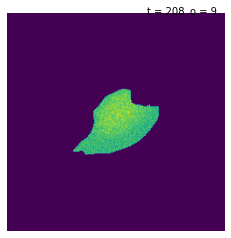

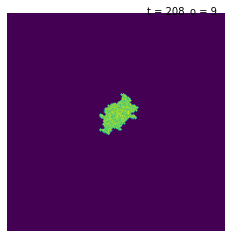

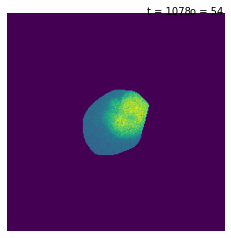

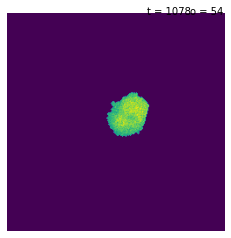

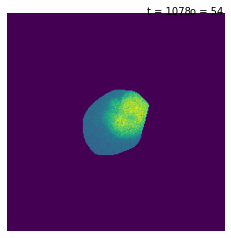

...

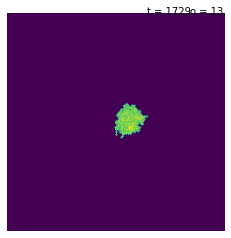

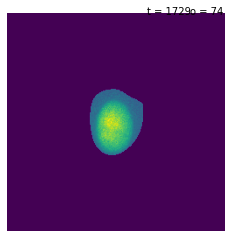

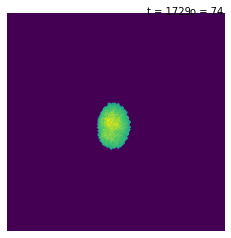

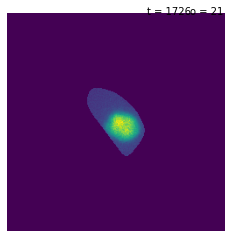

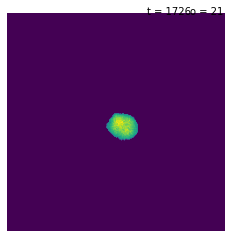

In [4]:
#----------------find long sub traj in a family---------------

mitosis_range=0

for posi in range(1,posi_end+1):
    
    posi_label = 'XY' + str(posi)
    dir_path=output_path+posi_label+'/'
    
    cells_path=dir_path+'cells/'
    fluor_img_path=main_path+'ori/'+posi_label+'_C2/'
    fluor_img_list=sorted(listdir(fluor_img_path))
    seg_path=output_path+posi_label+'/seg/'
    seg_list=sorted(listdir(seg_path))
 
    df=pd.read_csv(dir_path+'Per_Object_relink.csv')
    am_record=pd.read_csv(dir_path+'am_record.csv')
    traj_df=pd.read_csv(dir_path+'traj_object_num.csv')
    mitosis_df=pd.read_csv(dir_path+'mitosis_record.csv')
    with open (cells_path+'fluor_cells', 'rb') as fp:
        cells = pickle.load(fp)

    traj_record=pd.DataFrame(traj_df.loc[:,'1':str(time_span)])
    traj_record=traj_record.values

    traj_quan,traj_len=traj_record.shape[0],traj_record.shape[1]

    for traj_label in range(1,traj_quan+1):
        print(traj_label)
        cur_traj=traj_record[traj_label-1,:]
        traj_start_t=np.where(cur_traj!=-1)[0][0]+1
        
        family_tree={}
        family_tree=find_offspring(df,mitosis_df,family_tree,traj_label=traj_label)
        print('family',family_tree)
        all_branches=list(list(parse(traj_label, family_tree)))
        print('all branch',all_branches)
        
        for branch in all_branches:
            branch_end_label=branch[-1]
            branch_end_traj=traj_record[branch_end_label-1,:]
            branch_end_t=np.where(branch_end_traj!=-1)[0][-1]+1
            for sub_label in branch:
                
                sub_traj=traj_record[sub_label-1,:]
                daughter_flag=find_mother(mitosis_df,traj_label)
                
                mother_len = 0
                mother_len_thres = 12
                if daughter_flag==1:
                    mother_label=find_mother_label(mitosis_df,sub_label)
                    mother_traj=traj_record[mother_label-1,:]
                    mother_start_t=np.where(mother_traj!=-1)[0][0]+1
                    mother_end_t=np.where(mother_traj!=-1)[0][-1]+1
                    mother_len=mother_end_t-mother_start_t
                    
                    if mother_len >= mother_len_thres:
                        sub_traj[mother_end_t-mother_len_thres:mother_end_t]=\
                            mother_traj[mother_end_t-mother_len_thres:mother_end_t]
                    else:
                        mother_mask=mother_traj!=-1
                        sub_traj[mother_mask]=mother_traj[mother_mask]
                
                sub_start_t=np.where(sub_traj!=-1)[0][0]+1
                sub_end_t=np.where(sub_traj!=-1)[0][-1]+1

                if (sub_end_t-sub_start_t)>=traj_len_thres:

                    divide_points=[]
                    traj_name=str(sub_label)+'_'
                    
                    whole_branch=sub_traj[sub_start_t-1:sub_end_t]
                    whole_branch_loss_ratio=whole_branch[whole_branch==-1].shape[0]*1.0/whole_branch.shape[0]
                    if whole_branch_loss_ratio<loss_ratio_thres:

                        traj_feature,traj_contour,\
                            traj_cord,traj_seri,traj_am_flag,\
                            traj_vim_feature_values,traj_vim_pca_cord,\
                            traj_pcna_feature_values,traj_pcna_pca_cord=generate_fluor_long_traj(
                            df,cells,am_record,\
                            traj_df,sub_traj,\
                            ['vimentin','pcna'],feature_list,fluor_feature_name)

                        if len(traj_seri) >= 25:
                            traj_sct=fluor_single_cell_traj(traj_seri,traj_contour)
                            traj_sct.set_traj_feature(traj_feature)
                            traj_sct.set_traj_cord(traj_cord)
                            traj_sct.set_traj_divide_points(np.array(divide_points))
                            traj_sct.set_traj_am_flag(traj_am_flag)

                            traj_sct.set_traj_fluor_features('vimentin',feature_list,traj_vim_feature_values)
                            traj_sct.set_traj_fluor_pca_cord(fluor_feature_name[0],traj_vim_pca_cord)

                            traj_sct.set_traj_fluor_features('pcna',feature_list,traj_pcna_feature_values)
                            traj_sct.set_traj_fluor_pca_cord(fluor_feature_name[1],traj_pcna_pca_cord)

                            with open(sct_path+'sub_sct_'+posi_label+'_'+traj_name+'long_traj', 'wb') as fp:
                                pickle.dump(traj_sct, fp)


                            board_size=250

                            fig=plt.figure()
                            ax = fig.add_subplot(111)
                            ims=[]
                            for img_num,obj_num in traj_seri[traj_pcna_feature_values[0]>0]:
                                img_num=img_num.astype(np.int)
                                obj_num=obj_num.astype(np.int)
                                if obj_num!=-1:
                                    img=imread(fluor_img_path+fluor_img_list[img_num-1])
                                    seg_img=imread(seg_path+seg_list[img_num-1])
                                    crop_cell,crop_cell_env=generate_single_cell_img(img,seg_img,img_num,obj_num)
                                    x_c,y_c=crop_cell.shape[0]//2,crop_cell.shape[1]//2
                                    x_l,y_l=board_size//2-x_c,board_size//2-y_c
                                    cell_on_board=np.zeros((board_size,board_size))
                                    cell_on_board[x_l:x_l+crop_cell.shape[0],y_l:y_l+crop_cell.shape[1]]=crop_cell
                                    plt.axis('off')
                                    im=plt.imshow(cell_on_board,animated=True)
                                    t = ax.annotate('t = ' + str(img_num),(160,1))
                                    o = ax.annotate('o = ' + str(obj_num),(210,1))
                                    ims.append([im,t,o])

                            ani = animation.ArtistAnimation(fig, ims)
                            Writer = animation.writers['ffmpeg']
                            writer = Writer(fps=3, metadata=dict(artist='Thomas'), bitrate=-1)
                            ani.save(cell_ani_path+'sub_pcna_sct_'+posi_label+'_'+traj_name+'long_traj.mp4',writer)

                            fig=plt.figure()
                            ax = fig.add_subplot(111)
                            ims=[]
                            for img_num,obj_num in traj_seri[traj_pcna_feature_values[0]>0]:

                                img_num=img_num.astype(np.int)
                                obj_num=obj_num.astype(np.int)

                                img=imread(fluor_img_path+fluor_img_list[img_num-1])
                                seg=imread(seg_path+seg_list[img_num-1])

                                if obj_num!=-1:

                                    rps=regionprops(seg)
                                    candi_r=[r for r in rps if r.label==obj_num][0]
                                    candi_box=candi_r.bbox

                                    cell_mask = (seg == obj_num)
                                    region_cell_mask = cell_mask[candi_box[0]:candi_box[2], candi_box[1]:candi_box[3]]
                                    crop_img = img[candi_box[0]:candi_box[2], candi_box[1]:candi_box[3]]
                                    cell_img = (img*cell_mask)[candi_box[0]:candi_box[2],candi_box[1]:candi_box[3]]

                                    nuc_mask=cell_img>otsu(cell_img,selem=disk(max(cell_img.shape)/2), mask=cell_img>0)
                                    nuc_mask=remove_small_objects(opening(nuc_mask),100)
                                    nuc_mask=closing(nuc_mask)
                                    nuc_mask=remove_small_holes(nuc_mask,100)

                                    nuc_img=cell_img*nuc_mask

                                    x_c,y_c=nuc_img.shape[0]//2,nuc_img.shape[1]//2
                                    x_l,y_l=board_size//2-x_c,board_size//2-y_c
                                    cell_on_board=np.zeros((board_size,board_size))
                                    cell_on_board[x_l:x_l+nuc_img.shape[0],y_l:y_l+nuc_img.shape[1]]=nuc_img
                                    plt.axis('off')
                                    im=plt.imshow(cell_on_board,animated=True)
                                    t = ax.annotate('t = ' + str(img_num),(160,1))
                                    o = ax.annotate('o = ' + str(obj_num),(210,1))
                                    ims.append([im,t,o])

            #                 ani = animation.ArtistAnimation(fig, ims)
                            ani = animation.ArtistAnimation(fig, ims)
                            Writer = animation.writers['ffmpeg']
                            writer = Writer(fps=3, metadata=dict(artist='Thomas'), bitrate=-1)
                            ani.save(cell_nuc_ani_path+'sub_pcna_sct_'+posi_label+'_'+traj_name+'long_traj.mp4',writer)

XY1
family {}
all branch [[1]]
family {}
all branch [[2]]
family {}
all branch [[3]]
this cell has pca cord
6
this cell has pca cord
6
family {4: [15, 16]}
all branch [[4, 15], [4, 16]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[5]]
family {}
all branch [[6]]
family {7: [100, 101]}
all branch [[7, 100], [7, 101]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[8]]
family {}
all branch [[9]]
family {}
all branch [[10]]
family {11: [37, 38]}
all branch [[11, 37], [11, 38]]
family {12: [58, 57]}
all branch [[12, 58], [12, 57]]
family {13: [48, 49]}
all branch [[13, 48], [13, 49]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[14]]
family {}
all branch [[15]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[16]]
family {17: [39, 40], 40: [176, 177]}
all branch [[17, 39], [17, 40, 176], [1

this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[254]]
family {}
all branch [[255]]
family {}
all branch [[256]]
family {}
all branch [[257]]
family {}
all branch [[258]]
family {}
all branch [[259]]
family {}
all branch [[260]]
family {}
all branch [[261]]
family {}
all branch [[262]]
family {}
all branch [[263]]
family {}
all branch [[264]]
family {}
all branch [[265]]
family {}
all branch [[266]]
family {}
all branch [[267]]
family {}
all branch [[268]]
family {}
all branch [[269]]
family {}
all branch [[270]]
family {}
all branch [[271]]
family {}
all branch [[272]]
family {}
all branch [[273]]
family {}
all branch [[274]]
family {275: [418, 416], 418: [455, 456]}
all branch [[275, 418, 455], [275, 418, 456], [275, 416]]
family {}
all branch [[276]]
family {}
all branch [[277]]
family {278: [585, 582], 582: [1160, 1159]}
all branch [[278, 585], [278, 582, 1160], [278, 582, 1159]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this

family {}
all branch [[497]]
family {}
all branch [[498]]
family {}
all branch [[499]]
family {}
all branch [[500]]
family {}
all branch [[501]]
family {}
all branch [[502]]
family {}
all branch [[503]]
family {}
all branch [[504]]
family {}
all branch [[505]]
family {}
all branch [[506]]
family {}
all branch [[507]]
family {}
all branch [[508]]
family {}
all branch [[509]]
family {}
all branch [[510]]
this cell has pca cord
6
this cell has pca cord
6
family {511: [608, 609]}
all branch [[511, 608], [511, 609]]
family {512: [574, 573], 573: [664, 665]}
all branch [[512, 574], [512, 573, 664], [512, 573, 665]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[513]]
family {}
all branch [[514]]
family {}
all branch [[515]]
family {}
all branch [[516]]
family {}
all branch [[517]]
family {}
all branch [[518]]
family {}
all branch [[519]]
family {}
all branch [[520]]
family {}
all branch [[521]]
family {}
all branch [[522]]
family {}
all branch [[523]]
family {}
all 

family {}
all branch [[742]]
family {}
all branch [[743]]
family {}
all branch [[744]]
family {}
all branch [[745]]
family {}
all branch [[746]]
family {}
all branch [[747]]
family {}
all branch [[748]]
family {}
all branch [[749]]
family {}
all branch [[750]]
family {}
all branch [[751]]
family {}
all branch [[752]]
family {}
all branch [[753]]
family {}
all branch [[754]]
family {}
all branch [[755]]
family {}
all branch [[756]]
family {}
all branch [[757]]
family {}
all branch [[758]]
family {}
all branch [[759]]
family {}
all branch [[760]]
family {}
all branch [[761]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[762]]
family {}
all branch [[763]]
family {}
all branch [[764]]
family {}
all branch [[765]]
family {}
all branch [[766]]
family {}
all branch [[767]]
family {}
all branch [[768]]
family {}
all branch [[769]]
family {}
all branch [[770]]
family {}
all branch [[771]]
family {}
all branch [[772]]
family {}
all branch [[773]]
family {}
all branch [

family {}
all branch [[1015]]
family {}
all branch [[1016]]
family {}
all branch [[1017]]
family {}
all branch [[1018]]
family {}
all branch [[1019]]
family {}
all branch [[1020]]
family {}
all branch [[1021]]
family {}
all branch [[1022]]
family {}
all branch [[1023]]
family {}
all branch [[1024]]
family {}
all branch [[1025]]
family {}
all branch [[1026]]
family {}
all branch [[1027]]
family {}
all branch [[1028]]
family {}
all branch [[1029]]
family {}
all branch [[1030]]
family {}
all branch [[1031]]
family {}
all branch [[1032]]
family {}
all branch [[1033]]
family {}
all branch [[1034]]
family {}
all branch [[1035]]
family {}
all branch [[1036]]
family {}
all branch [[1037]]
family {}
all branch [[1038]]
family {}
all branch [[1039]]
family {}
all branch [[1040]]
family {}
all branch [[1041]]
family {}
all branch [[1042]]
family {}
all branch [[1043]]
family {}
all branch [[1044]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1045]]
this cell has pca co

family {}
all branch [[1287]]
family {}
all branch [[1288]]
family {}
all branch [[1289]]
family {}
all branch [[1290]]
family {}
all branch [[1291]]
family {}
all branch [[1292]]
family {}
all branch [[1293]]
family {}
all branch [[1294]]
family {}
all branch [[1295]]
family {}
all branch [[1296]]
family {}
all branch [[1297]]
family {}
all branch [[1298]]
family {}
all branch [[1299]]
family {}
all branch [[1300]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1301]]
family {}
all branch [[1302]]
family {1303: [1463, 1462]}
all branch [[1303, 1463], [1303, 1462]]
family {}
all branch [[1304]]
family {}
all branch [[1305]]
family {}
all branch [[1306]]
family {}
all branch [[1307]]
family {}
all branch [[1308]]
family {}
all branch [[1309]]
family {}
all branch [[1310]]
family {}
all branch [[1311]]
family {}
all branch [[1312]]
family {}
all branch [[1313]]
family {}
all branch [[1314]]
family {}
all branch [[1315]]
family {1316: [1419, 1417]}
all branch [[1

this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1528]]
family {}
all branch [[1529]]
family {}
all branch [[1530]]
family {}
all branch [[1531]]
family {}
all branch [[1532]]
family {}
all branch [[1533]]
family {}
all branch [[1534]]
family {}
all branch [[1535]]
family {}
all branch [[1536]]
family {}
all branch [[1537]]
family {}
all branch [[1538]]
family {}
all branch [[1539]]
family {}
all branch [[1540]]
family {}
all branch [[1541]]
family {}
all branch [[1542]]
family {}
all branch [[1543]]
family {}
all branch [[1544]]
family {}
all branch [[1545]]
family {}
all branch [[1546]]
family {}
all branch [[1547]]
family {1548: [1687, 1686]}
all branch [[1548, 1687], [1548, 1686]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1549]]
family {}
all branch [[1550]]
family {}
all branch [[1551]]
family {}
all branch [[1552]]
family {}
all branch [[1553]]
family {}
all branch [[1554]]
family {}
all branch [[1555]]
family {}
all branch [

family {}
all branch [[1819]]
family {}
all branch [[1820]]
family {}
all branch [[1821]]
family {}
all branch [[1822]]
family {}
all branch [[1823]]
family {}
all branch [[1824]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1825]]
family {}
all branch [[1826]]
family {}
all branch [[1827]]
family {}
all branch [[1828]]
family {}
all branch [[1829]]
family {}
all branch [[1830]]
family {}
all branch [[1831]]
family {}
all branch [[1832]]
family {}
all branch [[1833]]
family {}
all branch [[1834]]
family {}
all branch [[1835]]
family {}
all branch [[1836]]
family {}
all branch [[1837]]
family {}
all branch [[1838]]
family {}
all branch [[1839]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1840]]
family {}
all branch [[1841]]
family {}
all branch [[1842]]
family {}
all branch [[1843]]
family {}
all branch [[1844]]
family {}
all branch [[1845]]
family {}
all branch [[1846]]
family {}
all branch [[1847]]
family {}
all branch [[1848]]


family {}
all branch [[2104]]
family {}
all branch [[2105]]
family {}
all branch [[2106]]
family {}
all branch [[2107]]
family {}
all branch [[2108]]
family {}
all branch [[2109]]
family {}
all branch [[2110]]
family {}
all branch [[2111]]
family {}
all branch [[2112]]
family {}
all branch [[2113]]
family {}
all branch [[2114]]
family {}
all branch [[2115]]
family {2116: [2586, 2585]}
all branch [[2116, 2586], [2116, 2585]]
family {}
all branch [[2117]]
family {}
all branch [[2118]]
family {}
all branch [[2119]]
family {}
all branch [[2120]]
family {}
all branch [[2121]]
family {}
all branch [[2122]]
family {}
all branch [[2123]]
family {}
all branch [[2124]]
family {}
all branch [[2125]]
family {}
all branch [[2126]]
family {}
all branch [[2127]]
family {}
all branch [[2128]]
family {}
all branch [[2129]]
family {}
all branch [[2130]]
family {}
all branch [[2131]]
family {}
all branch [[2132]]
family {}
all branch [[2133]]
family {}
all branch [[2134]]
family {}
all branch [[2135]]
fa

family {}
all branch [[2395]]
family {}
all branch [[2396]]
family {}
all branch [[2397]]
family {}
all branch [[2398]]
family {}
all branch [[2399]]
family {}
all branch [[2400]]
family {}
all branch [[2401]]
family {}
all branch [[2402]]
family {}
all branch [[2403]]
family {}
all branch [[2404]]
family {}
all branch [[2405]]
family {}
all branch [[2406]]
family {}
all branch [[2407]]
family {2408: [2550, 2549]}
all branch [[2408, 2550], [2408, 2549]]
family {2409: [2432, 2430]}
all branch [[2409, 2432], [2409, 2430]]
family {}
all branch [[2410]]
family {}
all branch [[2411]]
family {}
all branch [[2412]]
family {}
all branch [[2413]]
family {}
all branch [[2414]]
family {}
all branch [[2415]]
family {}
all branch [[2416]]
family {}
all branch [[2417]]
family {}
all branch [[2418]]
family {}
all branch [[2419]]
family {}
all branch [[2420]]
family {}
all branch [[2421]]
family {}
all branch [[2422]]
family {}
all branch [[2423]]
family {}
all branch [[2424]]
family {}
all branch [[2

family {}
all branch [[2676]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2677]]
family {}
all branch [[2678]]
family {}
all branch [[2679]]
family {}
all branch [[2680]]
family {}
all branch [[2681]]
family {}
all branch [[2682]]
family {}
all branch [[2683]]
family {}
all branch [[2684]]
family {}
all branch [[2685]]
family {}
all branch [[2686]]
family {}
all branch [[2687]]
family {}
all branch [[2688]]
family {}
all branch [[2689]]
family {}
all branch [[2690]]
family {}
all branch [[2691]]
family {}
all branch [[2692]]
family {}
all branch [[2693]]
family {}
all branch [[2694]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2695]]
family {}
all branch [[2696]]
family {}
all branch [[2697]]
family {}
all branch [[2698]]
family {}
all branch [[2699]]
family {}
all branch [[2700]]
family {}
all branch [[2701]]
family {}
all branch [[2702]]
family {}
all branch [[2703]]
this cell has pca cord
6
this cell has pca cord
6
family {}


family {}
all branch [[2960]]
family {}
all branch [[2961]]
family {}
all branch [[2962]]
family {}
all branch [[2963]]
family {}
all branch [[2964]]
family {}
all branch [[2965]]
family {}
all branch [[2966]]
family {}
all branch [[2967]]
family {}
all branch [[2968]]
family {2969: [3038, 3035]}
all branch [[2969, 3038], [2969, 3035]]
family {}
all branch [[2970]]
family {}
all branch [[2971]]
family {}
all branch [[2972]]
family {}
all branch [[2973]]
family {}
all branch [[2974]]
family {}
all branch [[2975]]
family {}
all branch [[2976]]
family {}
all branch [[2977]]
family {}
all branch [[2978]]
family {}
all branch [[2979]]
family {}
all branch [[2980]]
family {}
all branch [[2981]]
family {}
all branch [[2982]]
family {}
all branch [[2983]]
family {}
all branch [[2984]]
family {}
all branch [[2985]]
family {}
all branch [[2986]]
family {}
all branch [[2987]]
family {}
all branch [[2988]]
family {}
all branch [[2989]]
family {}
all branch [[2990]]
this cell has pca cord
6
this ce

family {}
all branch [[3313]]
family {}
all branch [[3314]]
family {}
all branch [[3315]]
family {}
all branch [[3316]]
family {}
all branch [[3317]]
family {}
all branch [[3318]]
family {}
all branch [[3319]]
family {}
all branch [[3320]]
family {}
all branch [[3321]]
family {}
all branch [[3322]]
family {}
all branch [[3323]]
family {}
all branch [[3324]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3325]]
family {}
all branch [[3326]]
family {}
all branch [[3327]]
family {}
all branch [[3328]]
family {}
all branch [[3329]]
family {}
all branch [[3330]]
family {}
all branch [[3331]]
family {}
all branch [[3332]]
family {}
all branch [[3333]]
family {}
all branch [[3334]]
family {}
all branch [[3335]]
family {}
all branch [[3336]]
family {}
all branch [[3337]]
family {}
all branch [[3338]]
family {}
all branch [[3339]]
family {}
all branch [[3340]]
family {}
all branch [[3341]]
family {}
all branch [[3342]]
family {}
all branch [[3343]]
family {}
all branch

family {}
all branch [[3582]]
family {}
all branch [[3583]]
family {}
all branch [[3584]]
family {}
all branch [[3585]]
family {}
all branch [[3586]]
family {}
all branch [[3587]]
family {}
all branch [[3588]]
family {}
all branch [[3589]]
family {}
all branch [[3590]]
family {}
all branch [[3591]]
family {}
all branch [[3592]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3593]]
family {}
all branch [[3594]]
family {}
all branch [[3595]]
family {}
all branch [[3596]]
family {}
all branch [[3597]]
family {}
all branch [[3598]]
family {}
all branch [[3599]]
family {}
all branch [[3600]]
family {}
all branch [[3601]]
family {}
all branch [[3602]]
family {}
all branch [[3603]]
family {}
all branch [[3604]]
family {}
all branch [[3605]]
family {}
all branch [[3606]]
family {}
all branch [[3607]]
family {}
all branch [[3608]]
family {}
all branch [[3609]]
family {}
all branch [[3610]]
family {}
all branch [[3611]]
family {}
all branch [[3612]]
family {}
all branch

family {}
all branch [[3980]]
family {}
all branch [[3981]]
family {}
all branch [[3982]]
family {}
all branch [[3983]]
family {}
all branch [[3984]]
family {}
all branch [[3985]]
family {}
all branch [[3986]]
family {}
all branch [[3987]]
family {}
all branch [[3988]]
family {}
all branch [[3989]]
family {}
all branch [[3990]]
family {}
all branch [[3991]]
family {}
all branch [[3992]]
family {}
all branch [[3993]]
family {}
all branch [[3994]]
family {}
all branch [[3995]]
family {}
all branch [[3996]]
family {}
all branch [[3997]]
family {}
all branch [[3998]]
family {}
all branch [[3999]]
family {}
all branch [[4000]]
family {}
all branch [[4001]]
family {}
all branch [[4002]]
family {}
all branch [[4003]]
family {}
all branch [[4004]]
family {}
all branch [[4005]]
family {}
all branch [[4006]]
family {}
all branch [[4007]]
family {}
all branch [[4008]]
family {}
all branch [[4009]]
family {}
all branch [[4010]]
family {}
all branch [[4011]]
family {}
all branch [[4012]]
family {}


family {1: [77, 76]}
all branch [[1, 77], [1, 76]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2]]
family {}
all branch [[3]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[4]]
family {}
all branch [[5]]
family {6: [86, 87]}
all branch [[6, 86], [6, 87]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[7]]
family {}
all branch [[8]]
family {9: [118, 119]}
all branch [[9, 118], [9, 119]]
family {}
all branch [[10]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[11]]
family {}
all branch [[12]]
family {}
all branch [[13]]
family {}
all branch [[14]]
family {}
all branch [[15]]
family {}
all branch [[16]]
family {17: [75, 73], 73: [184, 185], 185: [238, 237]}
all branch [[17, 75], [17, 73, 184], [17, 73, 185, 238], [17, 73, 185, 237]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
fam

this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[230]]
family {}
all branch [[231]]
family {}
all branch [[232]]
family {}
all branch [[233]]
family {}
all branch [[234]]
family {}
all branch [[235]]
family {}
all branch [[236]]
family {}
all branch [[237]]
family {}
all branch [[238]]
family {}
all branch [[239]]
family {}
all branch [[240]]
family {}
all branch [[241]]
family {}
all branch [[242]]
family {}
all branch [[243]]
family {}
all branch [[244]]
family {}
all branch [[245]]
family {}
all branch [[246]]
family {}
all branch [[247]]
family {}
all branch [[248]]
family {}
all branch [[249]]
family {}
all branch [[250]]
family {}
all branch [[251]]
family {}
all branch [[252]]
family {}
all branch [[253]]
family {}
all branch [[254]]
family {}
all branch [[255]]
family {}
all branch [[256]]
family {}
all branch [[257]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[258]]
family {}
all branch [[259]]
family {260: [2744, 2745], 274

family {}
all branch [[487]]
family {}
all branch [[488]]
family {}
all branch [[489]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[490]]
family {}
all branch [[491]]
family {}
all branch [[492]]
family {}
all branch [[493]]
family {}
all branch [[494]]
family {}
all branch [[495]]
family {}
all branch [[496]]
family {}
all branch [[497]]
family {}
all branch [[498]]
family {}
all branch [[499]]
family {}
all branch [[500]]
family {}
all branch [[501]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[502]]
family {}
all branch [[503]]
family {}
all branch [[504]]
family {}
all branch [[505]]
family {}
all branch [[506]]
family {}
all branch [[507]]
family {}
all branch [[508]]
family {}
all branch [[509]]
family {}
all branch [[510]]
family {}
all branch [[511]]
family {}
all branch [[512]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[513]]
family {}
all branch [[514]]
family {}
all branch [[515]]
family {}

family {}
all branch [[741]]
family {}
all branch [[742]]
family {}
all branch [[743]]
family {}
all branch [[744]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[745]]
family {}
all branch [[746]]
family {}
all branch [[747]]
family {}
all branch [[748]]
family {}
all branch [[749]]
family {}
all branch [[750]]
family {}
all branch [[751]]
family {}
all branch [[752]]
family {}
all branch [[753]]
family {}
all branch [[754]]
family {}
all branch [[755]]
family {}
all branch [[756]]
family {}
all branch [[757]]
family {}
all branch [[758]]
family {}
all branch [[759]]
family {}
all branch [[760]]
family {}
all branch [[761]]
family {}
all branch [[762]]
family {}
all branch [[763]]
family {764: [856, 852]}
all branch [[764, 856], [764, 852]]
family {}
all branch [[765]]
family {}
all branch [[766]]
family {}
all branch [[767]]
family {}
all branch [[768]]
family {}
all branch [[769]]
family {}
all branch [[770]]
family {}
all branch [[771]]
family {}
all branc

family {}
all branch [[1019]]
family {}
all branch [[1020]]
family {}
all branch [[1021]]
family {1022: [1353, 1351]}
all branch [[1022, 1353], [1022, 1351]]
family {}
all branch [[1023]]
family {}
all branch [[1024]]
family {}
all branch [[1025]]
family {}
all branch [[1026]]
family {}
all branch [[1027]]
family {}
all branch [[1028]]
family {}
all branch [[1029]]
family {}
all branch [[1030]]
family {}
all branch [[1031]]
family {}
all branch [[1032]]
family {}
all branch [[1033]]
family {}
all branch [[1034]]
family {}
all branch [[1035]]
family {}
all branch [[1036]]
family {}
all branch [[1037]]
family {}
all branch [[1038]]
family {}
all branch [[1039]]
family {}
all branch [[1040]]
family {}
all branch [[1041]]
family {}
all branch [[1042]]
family {}
all branch [[1043]]
family {}
all branch [[1044]]
family {}
all branch [[1045]]
family {}
all branch [[1046]]
family {}
all branch [[1047]]
family {}
all branch [[1048]]
family {}
all branch [[1049]]
family {}
all branch [[1050]]
fa

family {}
all branch [[1341]]
family {}
all branch [[1342]]
family {}
all branch [[1343]]
family {1344: [2179, 2173]}
all branch [[1344, 2179], [1344, 2173]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1345]]
family {}
all branch [[1346]]
family {}
all branch [[1347]]
family {}
all branch [[1348]]
family {}
all branch [[1349]]
family {}
all branch [[1350]]
family {}
all branch [[1351]]
family {}
all branch [[1352]]
family {}
all branch [[1353]]
family {}
all branch [[1354]]
family {}
all branch [[1355]]
family {}
all branch [[1356]]
family {}
all branch [[1357]]
family {}
all branch [[1358]]
family {}
all branch [[1359]]
family {}
all branch [[1360]]
family {}
all branch [[1361]]
family {}
all branch [[1362]]
family {}
all branch [[1363]]
family {}
all branch [[1364]]
family {1365: [1387, 1386]}
all branch [[1365, 1387], [1365, 1386]]
family {}
all branch [[1366]]
family {}
all branch [[1367]]
family {}
all 

this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1597]]
family {}
all branch [[1598]]
family {}
all branch [[1599]]
family {}
all branch [[1600]]
family {}
all branch [[1601]]
family {}
all branch [[1602]]
family {}
all branch [[1603]]
family {}
all branch [[1604]]
family {}
all branch [[1605]]
family {}
all branch [[1606]]
family {}
all branch [[1607]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1608]]
family {}
all branch [[1609]]
family {}
all branch [[1610]]
family {}
all branch [[1611]]
family {}
all branch [[1612]]
family {}
all branch [[1613]]
family {}
all branch [[1614]]
family {}
all branch [[1615]]
family {}
all branch [[1616]]
family {}
all branch [[1617]]
family {}
all branch [[1618]]
family {}
all branch [[1619]]
family {}
all branch [[1620]]
family {}
all branch [[1621]]
family {}
all branch [[1622]]
family {}
all branch [[1623]]
family {}
all branch [[1624]]
family {}


family {}
all branch [[1849]]
family {}
all branch [[1850]]
family {}
all branch [[1851]]
family {}
all branch [[1852]]
family {}
all branch [[1853]]
family {}
all branch [[1854]]
family {}
all branch [[1855]]
family {}
all branch [[1856]]
family {}
all branch [[1857]]
family {}
all branch [[1858]]
family {}
all branch [[1859]]
family {}
all branch [[1860]]
family {}
all branch [[1861]]
family {1862: [2298, 2300], 2300: [2308, 2307]}
all branch [[1862, 2298], [1862, 2300, 2308], [1862, 2300, 2307]]
family {}
all branch [[1863]]
family {}
all branch [[1864]]
family {}
all branch [[1865]]
family {}
all branch [[1866]]
family {}
all branch [[1867]]
family {}
all branch [[1868]]
family {}
all branch [[1869]]
family {}
all branch [[1870]]
family {}
all branch [[1871]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1872]]
family {}
all branch [[1873]]
family {}
all branch [[1874]]
family {}
all branch [[1875]]
family {}
all branch [[1876]]
family {}
all branch [[187

family {}
all branch [[2129]]
family {}
all branch [[2130]]
family {}
all branch [[2131]]
family {}
all branch [[2132]]
family {}
all branch [[2133]]
family {}
all branch [[2134]]
family {}
all branch [[2135]]
family {}
all branch [[2136]]
family {}
all branch [[2137]]
family {}
all branch [[2138]]
family {}
all branch [[2139]]
family {}
all branch [[2140]]
family {}
all branch [[2141]]
family {}
all branch [[2142]]
family {}
all branch [[2143]]
family {}
all branch [[2144]]
family {}
all branch [[2145]]
family {2146: [3590, 3591]}
all branch [[2146, 3590], [2146, 3591]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2147]]
family {}
all branch [[2148]]
family {}
all branch [[2149]]
family {}
all branch [[2150]]
family {}
all branch [[2151]]
family {}
all branch [[2152]]
family {}
all branch [[2153]]
family {}
all branch [[2154]]
family {2155: [2455, 2454]}
all branch [[2155, 2455], [2155, 2454]]
family {}
all 

family {}
all branch [[2382]]
family {}
all branch [[2383]]
family {}
all branch [[2384]]
family {}
all branch [[2385]]
family {}
all branch [[2386]]
family {}
all branch [[2387]]
family {}
all branch [[2388]]
family {}
all branch [[2389]]
family {}
all branch [[2390]]
family {}
all branch [[2391]]
family {}
all branch [[2392]]
family {}
all branch [[2393]]
family {}
all branch [[2394]]
family {}
all branch [[2395]]
family {}
all branch [[2396]]
family {}
all branch [[2397]]
family {}
all branch [[2398]]
family {}
all branch [[2399]]
family {}
all branch [[2400]]
family {}
all branch [[2401]]
family {}
all branch [[2402]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2403]]
family {}
all branch [[2404]]
family {2405: [2596, 2595]}
all branch [[2405, 2596], [2405, 2595]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2406]]
family {2407: [2654, 2645]}
all branch [[2407, 2654], [2407, 2645]]
this cell has pca cord
6
this cell has pca c

family {}
all branch [[2636]]
family {}
all branch [[2637]]
family {}
all branch [[2638]]
family {}
all branch [[2639]]
family {}
all branch [[2640]]
family {}
all branch [[2641]]
family {}
all branch [[2642]]
family {}
all branch [[2643]]
family {}
all branch [[2644]]
family {}
all branch [[2645]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2646]]
family {}
all branch [[2647]]
family {}
all branch [[2648]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2649]]
family {}
all branch [[2650]]
family {}
all branch [[2651]]
family {}
all branch [[2652]]
family {}
all branch [[2653]]
family {}
all branch [[2654]]
family {}
all branch [[2655]]
family {}
all branch [[2656]]
family {}
all branch [[2657]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2658]]
family {}
all branch [[2659]]
family {}
all branch [[2660]]
family {}
all branch [[2661]]
family {}
all branch [[2662]]
family {}
all branch [[2663]]
family {}


family {}
all branch [[2911]]
family {}
all branch [[2912]]
family {}
all branch [[2913]]
family {}
all branch [[2914]]
family {}
all branch [[2915]]
family {}
all branch [[2916]]
family {}
all branch [[2917]]
family {}
all branch [[2918]]
family {}
all branch [[2919]]
family {}
all branch [[2920]]
family {}
all branch [[2921]]
family {}
all branch [[2922]]
family {}
all branch [[2923]]
family {}
all branch [[2924]]
family {}
all branch [[2925]]
family {}
all branch [[2926]]
family {}
all branch [[2927]]
family {}
all branch [[2928]]
family {}
all branch [[2929]]
family {}
all branch [[2930]]
family {}
all branch [[2931]]
family {}
all branch [[2932]]
family {}
all branch [[2933]]
family {}
all branch [[2934]]
family {}
all branch [[2935]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2936]]
family {}
all branch [[2937]]
family {}
all branch [[2938]]
family {}
all branch [[2939]]
family {}
all branch [[2940]]
family {}
all branch [[2941]]
family {}
all branch

family {}
all branch [[3159]]
family {}
all branch [[3160]]
family {}
all branch [[3161]]
family {}
all branch [[3162]]
family {}
all branch [[3163]]
family {}
all branch [[3164]]
family {}
all branch [[3165]]
family {}
all branch [[3166]]
family {}
all branch [[3167]]
family {}
all branch [[3168]]
family {}
all branch [[3169]]
family {}
all branch [[3170]]
family {}
all branch [[3171]]
family {}
all branch [[3172]]
family {}
all branch [[3173]]
family {}
all branch [[3174]]
family {}
all branch [[3175]]
family {}
all branch [[3176]]
family {}
all branch [[3177]]
family {}
all branch [[3178]]
family {}
all branch [[3179]]
family {}
all branch [[3180]]
family {}
all branch [[3181]]
family {}
all branch [[3182]]
family {}
all branch [[3183]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3184]]
family {}
all branch [[3185]]
family {}
all branch [[3186]]
family {}
all branch [[3187]]
family {}
all branch [[3188]]
family {}
all branch [[3189]]
family {}
all branch

family {}
all branch [[3423]]
family {}
all branch [[3424]]
family {}
all branch [[3425]]
family {}
all branch [[3426]]
family {}
all branch [[3427]]
family {}
all branch [[3428]]
family {}
all branch [[3429]]
family {}
all branch [[3430]]
family {}
all branch [[3431]]
family {}
all branch [[3432]]
family {}
all branch [[3433]]
family {}
all branch [[3434]]
family {}
all branch [[3435]]
family {}
all branch [[3436]]
family {}
all branch [[3437]]
family {}
all branch [[3438]]
family {}
all branch [[3439]]
family {}
all branch [[3440]]
family {}
all branch [[3441]]
family {}
all branch [[3442]]
family {}
all branch [[3443]]
family {3444: [3472, 3474]}
all branch [[3444, 3472], [3444, 3474]]
family {}
all branch [[3445]]
family {3446: [3580, 3576]}
all branch [[3446, 3580], [3446, 3576]]
family {}
all branch [[3447]]
family {}
all branch [[3448]]
family {}
all branch [[3449]]
family {}
all branch [[3450]]
family {}
all branch [[3451]]
family {}
all branch [[3452]]
family {}
all branch [[3

family {}
all branch [[3704]]
family {}
all branch [[3705]]
family {}
all branch [[3706]]
family {}
all branch [[3707]]
family {}
all branch [[3708]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3709]]
family {}
all branch [[3710]]
family {}
all branch [[3711]]
family {}
all branch [[3712]]
family {}
all branch [[3713]]
family {}
all branch [[3714]]
family {}
all branch [[3715]]
family {}
all branch [[3716]]
family {}
all branch [[3717]]
family {}
all branch [[3718]]
family {}
all branch [[3719]]
family {}
all branch [[3720]]
family {}
all branch [[3721]]
family {}
all branch [[3722]]
family {3723: [3901, 3906]}
all branch [[3723, 3901], [3723, 3906]]
family {}
all branch [[3724]]
family {}
all branch [[3725]]
family {}
all branch [[3726]]
family {}
all branch [[3727]]
family {}
all branch [[3728]]
family {}
all branch [[3729]]
family {}
all branch [[3730]]
family {}
all branch [[3731]]
family {}
all branch [[3732]]
family {}
all branch [[3733]]
family {}
al

family {}
all branch [[3942]]
family {}
all branch [[3943]]
family {3944: [4004, 4007]}
all branch [[3944, 4004], [3944, 4007]]
family {}
all branch [[3945]]
family {}
all branch [[3946]]
family {}
all branch [[3947]]
family {}
all branch [[3948]]
family {}
all branch [[3949]]
family {}
all branch [[3950]]
family {}
all branch [[3951]]
family {}
all branch [[3952]]
family {}
all branch [[3953]]
family {}
all branch [[3954]]
family {}
all branch [[3955]]
family {}
all branch [[3956]]
family {}
all branch [[3957]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3958]]
family {}
all branch [[3959]]
family {}
all branch [[3960]]
family {}
all branch [[3961]]
family {}
all branch [[3962]]
family {}
all branch [[3963]]
family {}
all branch [[3964]]
family {}
all branch [[3965]]
family {}
all branch [[3966]]
family {}
all branch [[3967]]
family {}
all branch [[3968]]
family {}
all branch [[3969]]
family {}
all branch [[3970]]
family {}
all branch [[3971]]
family {}
al

family {}
all branch [[4231]]
family {}
all branch [[4232]]
family {}
all branch [[4233]]
family {}
all branch [[4234]]
family {}
all branch [[4235]]
family {}
all branch [[4236]]
family {}
all branch [[4237]]
family {}
all branch [[4238]]
family {}
all branch [[4239]]
family {}
all branch [[4240]]
family {}
all branch [[4241]]
family {}
all branch [[4242]]
family {}
all branch [[4243]]
family {}
all branch [[4244]]
family {}
all branch [[4245]]
family {}
all branch [[4246]]
family {}
all branch [[4247]]
family {}
all branch [[4248]]
family {}
all branch [[4249]]
family {}
all branch [[4250]]
family {}
all branch [[4251]]
family {}
all branch [[4252]]
family {}
all branch [[4253]]
family {}
all branch [[4254]]
family {}
all branch [[4255]]
family {4256: [4420, 4424]}
all branch [[4256, 4420], [4256, 4424]]
family {}
all branch [[4257]]
family {}
all branch [[4258]]
family {}
all branch [[4259]]
family {}
all branch [[4260]]
family {}
all branch [[4261]]
family {}
all branch [[4262]]
fa

family {}
all branch [[4507]]
family {}
all branch [[4508]]
family {}
all branch [[4509]]
family {}
all branch [[4510]]
family {}
all branch [[4511]]
family {}
all branch [[4512]]
family {}
all branch [[4513]]
family {}
all branch [[4514]]
family {}
all branch [[4515]]
family {}
all branch [[4516]]
family {}
all branch [[4517]]
family {}
all branch [[4518]]
family {}
all branch [[4519]]
family {}
all branch [[4520]]
family {}
all branch [[4521]]
family {}
all branch [[4522]]
family {}
all branch [[4523]]
family {}
all branch [[4524]]
family {}
all branch [[4525]]
family {}
all branch [[4526]]
family {}
all branch [[4527]]
family {}
all branch [[4528]]
family {}
all branch [[4529]]
family {}
all branch [[4530]]
family {}
all branch [[4531]]
family {}
all branch [[4532]]
family {}
all branch [[4533]]
family {}
all branch [[4534]]
family {}
all branch [[4535]]
family {}
all branch [[4536]]
family {}
all branch [[4537]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch

family {}
all branch [[4782]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[4783]]
family {}
all branch [[4784]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[4785]]
family {}
all branch [[4786]]
family {}
all branch [[4787]]
family {}
all branch [[4788]]
family {}
all branch [[4789]]
family {}
all branch [[4790]]
family {}
all branch [[4791]]
family {}
all branch [[4792]]
family {}
all branch [[4793]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[4794]]
family {}
all branch [[4795]]
family {}
all branch [[4796]]
family {}
all branch [[4797]]
family {}
all branch [[4798]]
family {}
all branch [[4799]]
family {}
all branch [[4800]]
family {}
all branch [[4801]]
family {}
all branch [[4802]]
family {}
all branch [[4803]]
family {}
all branch [[4804]]
family {}
all branch [[4805]]
family {}
all branch [[4806]]
family {}
all branch [[4807]]
family {}
all branch [[4808]]
family {}
all branch [[4809]]
this cell 

family {}
all branch [[5051]]
family {}
all branch [[5052]]
family {}
all branch [[5053]]
family {}
all branch [[5054]]
family {}
all branch [[5055]]
family {}
all branch [[5056]]
family {}
all branch [[5057]]
family {}
all branch [[5058]]
family {}
all branch [[5059]]
family {}
all branch [[5060]]
family {}
all branch [[5061]]
family {}
all branch [[5062]]
family {}
all branch [[5063]]
family {}
all branch [[5064]]
family {}
all branch [[5065]]
family {}
all branch [[5066]]
family {}
all branch [[5067]]
family {}
all branch [[5068]]
family {}
all branch [[5069]]
family {}
all branch [[5070]]
family {}
all branch [[5071]]
family {}
all branch [[5072]]
family {}
all branch [[5073]]
family {}
all branch [[5074]]
family {}
all branch [[5075]]
family {}
all branch [[5076]]
family {}
all branch [[5077]]
family {}
all branch [[5078]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[5079]]
family {}
all branch [[5080]]
family {}
all branch [[5081]]
family {}
all branch

family {}
all branch [[5385]]
family {}
all branch [[5386]]
family {}
all branch [[5387]]
family {}
all branch [[5388]]
family {}
all branch [[5389]]
family {5390: [5513, 5509]}
all branch [[5390, 5513], [5390, 5509]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[5391]]
family {}
all branch [[5392]]
family {}
all branch [[5393]]
family {}
all branch [[5394]]
family {}
all branch [[5395]]
family {}
all branch [[5396]]
family {}
all branch [[5397]]
family {5398: [5711, 5717]}
all branch [[5398, 5711], [5398, 5717]]
family {}
all branch [[5399]]
family {}
all branch [[5400]]
family {}
all branch [[5401]]
family {}
all branch [[5402]]
family {}
all branch [[5403]]
family {}
all branch [[5404]]
family {}
all branch [[5405]]
family {}
all branch [[5406]]
family {}
all branch [[5407]]
family {}
all branch [[5408]]
family {}
all branch [[5409]]
family {}
all branch [[5410]]
family {}
all branch [[5411]]
family {}
all branch [[5412]]
family {}
all branch [[5413]]
fami

family {}
all branch [[5647]]
family {}
all branch [[5648]]
family {}
all branch [[5649]]
family {}
all branch [[5650]]
family {}
all branch [[5651]]
family {}
all branch [[5652]]
family {}
all branch [[5653]]
family {}
all branch [[5654]]
family {}
all branch [[5655]]
family {}
all branch [[5656]]
family {}
all branch [[5657]]
family {}
all branch [[5658]]
family {}
all branch [[5659]]
family {}
all branch [[5660]]
family {}
all branch [[5661]]
family {}
all branch [[5662]]
family {}
all branch [[5663]]
family {}
all branch [[5664]]
family {}
all branch [[5665]]
family {}
all branch [[5666]]
family {}
all branch [[5667]]
family {}
all branch [[5668]]
family {}
all branch [[5669]]
family {}
all branch [[5670]]
family {5671: [6583, 6587]}
all branch [[5671, 6583], [5671, 6587]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[5672]]
family {}
all branch [[5673]]
family {}
all branch [[5674]]
family {}
all branch [[5675]]
family {}
all branch [[5676]]
family {}
al

family {}
all branch [[5959]]
family {}
all branch [[5960]]
family {}
all branch [[5961]]
family {}
all branch [[5962]]
family {}
all branch [[5963]]
family {}
all branch [[5964]]
family {}
all branch [[5965]]
family {}
all branch [[5966]]
family {}
all branch [[5967]]
family {}
all branch [[5968]]
family {}
all branch [[5969]]
family {}
all branch [[5970]]
family {}
all branch [[5971]]
family {}
all branch [[5972]]
family {}
all branch [[5973]]
family {}
all branch [[5974]]
family {}
all branch [[5975]]
family {}
all branch [[5976]]
family {}
all branch [[5977]]
family {}
all branch [[5978]]
family {}
all branch [[5979]]
family {}
all branch [[5980]]
family {}
all branch [[5981]]
family {}
all branch [[5982]]
family {}
all branch [[5983]]
family {}
all branch [[5984]]
family {}
all branch [[5985]]
family {}
all branch [[5986]]
family {}
all branch [[5987]]
family {}
all branch [[5988]]
family {}
all branch [[5989]]
family {}
all branch [[5990]]
family {}
all branch [[5991]]
family {}


family {}
all branch [[6282]]
family {}
all branch [[6283]]
family {}
all branch [[6284]]
family {}
all branch [[6285]]
family {}
all branch [[6286]]
family {}
all branch [[6287]]
family {}
all branch [[6288]]
family {}
all branch [[6289]]
family {}
all branch [[6290]]
family {}
all branch [[6291]]
family {}
all branch [[6292]]
family {}
all branch [[6293]]
family {}
all branch [[6294]]
family {}
all branch [[6295]]
family {}
all branch [[6296]]
family {}
all branch [[6297]]
family {}
all branch [[6298]]
family {}
all branch [[6299]]
family {}
all branch [[6300]]
family {}
all branch [[6301]]
family {}
all branch [[6302]]
family {}
all branch [[6303]]
family {}
all branch [[6304]]
family {}
all branch [[6305]]
family {}
all branch [[6306]]
family {}
all branch [[6307]]
family {}
all branch [[6308]]
family {}
all branch [[6309]]
family {}
all branch [[6310]]
family {}
all branch [[6311]]
family {}
all branch [[6312]]
family {}
all branch [[6313]]
family {}
all branch [[6314]]
family {}


family {}
all branch [[6590]]
family {}
all branch [[6591]]
family {}
all branch [[6592]]
family {}
all branch [[6593]]
family {}
all branch [[6594]]
family {}
all branch [[6595]]
family {}
all branch [[6596]]
family {}
all branch [[6597]]
family {}
all branch [[6598]]
family {}
all branch [[6599]]
family {}
all branch [[6600]]
family {}
all branch [[6601]]
family {}
all branch [[6602]]
family {}
all branch [[6603]]
family {}
all branch [[6604]]
family {}
all branch [[6605]]
family {}
all branch [[6606]]
family {}
all branch [[6607]]
family {}
all branch [[6608]]
family {}
all branch [[6609]]
family {}
all branch [[6610]]
family {}
all branch [[6611]]
family {}
all branch [[6612]]
family {}
all branch [[6613]]
family {}
all branch [[6614]]
family {}
all branch [[6615]]
family {}
all branch [[6616]]
family {}
all branch [[6617]]
family {}
all branch [[6618]]
family {}
all branch [[6619]]
family {}
all branch [[6620]]
family {}
all branch [[6621]]
family {}
all branch [[6622]]
family {}


family {}
all branch [[6931]]
family {}
all branch [[6932]]
family {}
all branch [[6933]]
family {}
all branch [[6934]]
family {}
all branch [[6935]]
family {}
all branch [[6936]]
family {}
all branch [[6937]]
family {}
all branch [[6938]]
family {}
all branch [[6939]]
family {}
all branch [[6940]]
family {}
all branch [[6941]]
family {}
all branch [[6942]]
family {}
all branch [[6943]]
family {}
all branch [[6944]]
family {}
all branch [[6945]]
family {}
all branch [[6946]]
family {}
all branch [[6947]]
family {}
all branch [[6948]]
family {}
all branch [[6949]]
family {}
all branch [[6950]]
family {}
all branch [[6951]]
family {}
all branch [[6952]]
family {}
all branch [[6953]]
family {}
all branch [[6954]]
family {}
all branch [[6955]]
family {}
all branch [[6956]]
family {}
all branch [[6957]]
family {}
all branch [[6958]]
family {}
all branch [[6959]]
family {}
all branch [[6960]]
family {}
all branch [[6961]]
family {}
all branch [[6962]]
family {}
all branch [[6963]]
family {}


family {}
all branch [[161]]
family {}
all branch [[162]]
family {}
all branch [[163]]
family {}
all branch [[164]]
family {}
all branch [[165]]
family {}
all branch [[166]]
family {}
all branch [[167]]
family {}
all branch [[168]]
family {}
all branch [[169]]
family {}
all branch [[170]]
family {}
all branch [[171]]
family {}
all branch [[172]]
family {}
all branch [[173]]
family {}
all branch [[174]]
family {}
all branch [[175]]
family {}
all branch [[176]]
family {}
all branch [[177]]
family {}
all branch [[178]]
family {}
all branch [[179]]
family {}
all branch [[180]]
family {}
all branch [[181]]
family {}
all branch [[182]]
family {}
all branch [[183]]
family {}
all branch [[184]]
family {}
all branch [[185]]
family {}
all branch [[186]]
family {}
all branch [[187]]
family {}
all branch [[188]]
family {}
all branch [[189]]
family {}
all branch [[190]]
family {}
all branch [[191]]
family {}
all branch [[192]]
family {}
all branch [[193]]
family {}
all branch [[194]]
family {}
all 

family {}
all branch [[447]]
family {}
all branch [[448]]
family {}
all branch [[449]]
family {}
all branch [[450]]
family {}
all branch [[451]]
family {}
all branch [[452]]
family {}
all branch [[453]]
family {}
all branch [[454]]
family {}
all branch [[455]]
family {}
all branch [[456]]
family {}
all branch [[457]]
family {}
all branch [[458]]
family {}
all branch [[459]]
family {}
all branch [[460]]
family {}
all branch [[461]]
family {}
all branch [[462]]
family {}
all branch [[463]]
family {}
all branch [[464]]
family {}
all branch [[465]]
family {}
all branch [[466]]
family {}
all branch [[467]]
family {}
all branch [[468]]
family {}
all branch [[469]]
family {}
all branch [[470]]
family {}
all branch [[471]]
family {}
all branch [[472]]
family {}
all branch [[473]]
family {}
all branch [[474]]
family {}
all branch [[475]]
family {}
all branch [[476]]
family {}
all branch [[477]]
family {}
all branch [[478]]
family {}
all branch [[479]]
family {}
all branch [[480]]
family {}
all 

family {}
all branch [[698]]
family {}
all branch [[699]]
family {}
all branch [[700]]
family {}
all branch [[701]]
family {}
all branch [[702]]
family {703: [722, 721]}
all branch [[703, 722], [703, 721]]
family {}
all branch [[704]]
family {}
all branch [[705]]
family {}
all branch [[706]]
family {}
all branch [[707]]
family {}
all branch [[708]]
family {}
all branch [[709]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[710]]
family {}
all branch [[711]]
family {}
all branch [[712]]
family {713: [993, 992]}
all branch [[713, 993], [713, 992]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[714]]
family {}
all branch [[715]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[716]]
family {}
all branch [[717]]
family {}
all branch [[718]]
family {}
all branch [[719]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[720]]
family {}
all branc

family {}
all branch [[954]]
family {}
all branch [[955]]
family {}
all branch [[956]]
family {}
all branch [[957]]
family {958: [964, 961]}
all branch [[958, 964], [958, 961]]
family {}
all branch [[959]]
family {}
all branch [[960]]
family {}
all branch [[961]]
family {}
all branch [[962]]
family {}
all branch [[963]]
family {}
all branch [[964]]
family {}
all branch [[965]]
family {}
all branch [[966]]
family {}
all branch [[967]]
family {}
all branch [[968]]
family {}
all branch [[969]]
family {}
all branch [[970]]
family {}
all branch [[971]]
family {}
all branch [[972]]
family {}
all branch [[973]]
family {974: [981, 984]}
all branch [[974, 981], [974, 984]]
family {}
all branch [[975]]
family {}
all branch [[976]]
family {}
all branch [[977]]
family {}
all branch [[978]]
family {}
all branch [[979]]
family {}
all branch [[980]]
family {}
all branch [[981]]
family {}
all branch [[982]]
family {}
all branch [[983]]
family {}
all branch [[984]]
family {}
all branch [[985]]
family {

family {}
all branch [[1226]]
family {}
all branch [[1227]]
family {}
all branch [[1228]]
family {}
all branch [[1229]]
family {}
all branch [[1230]]
family {}
all branch [[1231]]
family {}
all branch [[1232]]
family {}
all branch [[1233]]
family {}
all branch [[1234]]
family {}
all branch [[1235]]
family {}
all branch [[1236]]
family {}
all branch [[1237]]
family {}
all branch [[1238]]
family {}
all branch [[1239]]
family {}
all branch [[1240]]
family {}
all branch [[1241]]
family {}
all branch [[1242]]
family {}
all branch [[1243]]
family {}
all branch [[1244]]
family {}
all branch [[1245]]
family {}
all branch [[1246]]
family {1247: [1299, 1293]}
all branch [[1247, 1299], [1247, 1293]]
family {}
all branch [[1248]]
family {}
all branch [[1249]]
family {}
all branch [[1250]]
family {}
all branch [[1251]]
family {}
all branch [[1252]]
family {}
all branch [[1253]]
family {}
all branch [[1254]]
family {}
all branch [[1255]]
family {}
all branch [[1256]]
family {}
all branch [[1257]]
fa

family {}
all branch [[1466]]
family {}
all branch [[1467]]
family {}
all branch [[1468]]
family {}
all branch [[1469]]
family {}
all branch [[1470]]
family {}
all branch [[1471]]
family {}
all branch [[1472]]
family {}
all branch [[1473]]
family {}
all branch [[1474]]
family {}
all branch [[1475]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1476]]
family {}
all branch [[1477]]
family {}
all branch [[1478]]
family {}
all branch [[1479]]
family {}
all branch [[1480]]
family {}
all branch [[1481]]
family {1482: [1926, 1924]}
all branch [[1482, 1926], [1482, 1924]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1483]]
family {}
all branch [[1484]]
family {}
all branch [[1485]]
family {}
all branch [[1486]]
family {}
all branch [[1487]]
family {}
all branch [[1488]]
family {}
all branch [[1489]]
family {}
all branch [[1490]]
family {}
all branch [[1491]]
family {}
all branch [[1492]]
fa

family {}
all branch [[1718]]
family {}
all branch [[1719]]
family {}
all branch [[1720]]
family {}
all branch [[1721]]
family {}
all branch [[1722]]
family {}
all branch [[1723]]
family {}
all branch [[1724]]
family {}
all branch [[1725]]
family {}
all branch [[1726]]
family {1727: [2334, 2335]}
all branch [[1727, 2334], [1727, 2335]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1728]]
family {}
all branch [[1729]]
family {}
all branch [[1730]]
family {}
all branch [[1731]]
family {}
all branch [[1732]]
family {}
all branch [[1733]]
family {}
all branch [[1734]]
family {}
all branch [[1735]]
family {}
all branch [[1736]]
family {}
all branch [[1737]]
family {}
all branch [[1738]]
family {}
all branch [[1739]]
family {}
all branch [[1740]]
family {}
all branch [[1741]]
family {}
all branch [[1742]]
family {}
all branch [[1743]]
family {}
all branch [[1744]]
family {}
all branch [[1745]]
this cell has pca cord

family {}
all branch [[1959]]
family {}
all branch [[1960]]
family {}
all branch [[1961]]
family {1962: [2040, 2035]}
all branch [[1962, 2040], [1962, 2035]]
family {}
all branch [[1963]]
family {}
all branch [[1964]]
family {}
all branch [[1965]]
family {}
all branch [[1966]]
family {}
all branch [[1967]]
family {}
all branch [[1968]]
family {}
all branch [[1969]]
family {}
all branch [[1970]]
family {}
all branch [[1971]]
family {}
all branch [[1972]]
family {}
all branch [[1973]]
family {}
all branch [[1974]]
family {}
all branch [[1975]]
family {}
all branch [[1976]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1977]]
family {}
all branch [[1978]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[1979]]
family {}
all branch [[1980]]
family {}
all branch [[1981]]
family {1982: [2012, 2011]}
all branch [[1982, 2012], [1982, 2011]]
family {}
all branch [[1983]]
family {}
all branch [[1984]]
this cell has pca cord
6
this cell has pca c

this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2249]]
family {}
all branch [[2250]]
family {}
all branch [[2251]]
family {}
all branch [[2252]]
family {}
all branch [[2253]]
family {}
all branch [[2254]]
family {}
all branch [[2255]]
family {}
all branch [[2256]]
family {}
all branch [[2257]]
family {}
all branch [[2258]]
family {}
all branch [[2259]]
family {}
all branch [[2260]]
family {}
all branch [[2261]]
family {}
all branch [[2262]]
family {}
all branch [[2263]]
family {}
all branch [[2264]]
family {}
all branch [[2265]]
family {}
all branch [[2266]]
family {}
all branch [[2267]]
family {}
all branch [[2268]]
family {}
all branch [[2269]]
family {}
all branch [[2270]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2271]]
family {}
all branch [[2272]]
family {}
all branch [[2273]]
family {}
all branch [[2274]]
family {}
all branch [[2275]]
family {}
all branch [[2276]]
family {}
all branch [[2277]]
family {2278: [2291, 2289]}
al

family {}
all branch [[2500]]
family {}
all branch [[2501]]
family {}
all branch [[2502]]
family {}
all branch [[2503]]
family {}
all branch [[2504]]
family {}
all branch [[2505]]
family {}
all branch [[2506]]
family {}
all branch [[2507]]
family {}
all branch [[2508]]
family {}
all branch [[2509]]
family {}
all branch [[2510]]
family {}
all branch [[2511]]
family {}
all branch [[2512]]
family {}
all branch [[2513]]
family {}
all branch [[2514]]
family {}
all branch [[2515]]
family {}
all branch [[2516]]
family {}
all branch [[2517]]
family {}
all branch [[2518]]
family {}
all branch [[2519]]
family {}
all branch [[2520]]
family {}
all branch [[2521]]
family {}
all branch [[2522]]
family {}
all branch [[2523]]
family {}
all branch [[2524]]
family {}
all branch [[2525]]
family {}
all branch [[2526]]
family {}
all branch [[2527]]
family {}
all branch [[2528]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2529]]
family {}
all branch [[2530]]
family {}
all branch

family {}
all branch [[2818]]
family {}
all branch [[2819]]
family {}
all branch [[2820]]
family {}
all branch [[2821]]
family {}
all branch [[2822]]
family {}
all branch [[2823]]
family {}
all branch [[2824]]
family {}
all branch [[2825]]
family {}
all branch [[2826]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2827]]
family {}
all branch [[2828]]
family {}
all branch [[2829]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2830]]
family {}
all branch [[2831]]
family {}
all branch [[2832]]
family {}
all branch [[2833]]
family {}
all branch [[2834]]
family {}
all branch [[2835]]
family {}
all branch [[2836]]
family {}
all branch [[2837]]
family {}
all branch [[2838]]
family {}
all branch [[2839]]
family {}
all branch [[2840]]
family {}
all branch [[2841]]
family {}
all branch [[2842]]
family {}
all branch [[2843]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[2844]]
family {}
all branch [[2845]]
family {}


family {}
all branch [[3068]]
family {}
all branch [[3069]]
family {}
all branch [[3070]]
family {}
all branch [[3071]]
family {}
all branch [[3072]]
family {}
all branch [[3073]]
family {}
all branch [[3074]]
family {}
all branch [[3075]]
family {}
all branch [[3076]]
family {}
all branch [[3077]]
family {}
all branch [[3078]]
family {}
all branch [[3079]]
family {}
all branch [[3080]]
family {}
all branch [[3081]]
family {}
all branch [[3082]]
family {3083: [3285, 3288]}
all branch [[3083, 3285], [3083, 3288]]
family {}
all branch [[3084]]
family {}
all branch [[3085]]
family {}
all branch [[3086]]
family {}
all branch [[3087]]
family {}
all branch [[3088]]
family {}
all branch [[3089]]
family {}
all branch [[3090]]
family {3091: [3283, 3282]}
all branch [[3091, 3283], [3091, 3282]]
family {}
all branch [[3092]]
family {}
all branch [[3093]]
family {}
all branch [[3094]]
family {}
all branch [[3095]]
family {}
all branch [[3096]]
family {}
all branch [[3097]]
family {}
all branch [[3

this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3324]]
family {}
all branch [[3325]]
family {}
all branch [[3326]]
family {}
all branch [[3327]]
family {}
all branch [[3328]]
family {}
all branch [[3329]]
family {}
all branch [[3330]]
family {3331: [4327, 4332]}
all branch [[3331, 4327], [3331, 4332]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {3332: [3670, 3676]}
all branch [[3332, 3670], [3332, 3676]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3333]]
family {}
all branch [[3334]]
family {}
all branch [[3335]]
family {}
all branch [[3336]]
family {}
all branch [[3337]]
family {}
all branch [[3338]]
family {}
all branch [[3339]]
family {}
all branch [[3340]]
family {}
all branch [[3341]]
family {}
all branch [[3342]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3343]]
family {}
all branch [[3344]]
family {}
all branch [[3345]]
family {3346: 

family {}
all branch [[3560]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3561]]
family {}
all branch [[3562]]
family {}
all branch [[3563]]
family {}
all branch [[3564]]
family {}
all branch [[3565]]
family {}
all branch [[3566]]
family {}
all branch [[3567]]
family {}
all branch [[3568]]
family {}
all branch [[3569]]
family {}
all branch [[3570]]
this cell has pca cord
6
this cell has pca cord
6
family {3571: [3925, 3929]}
all branch [[3571, 3925], [3571, 3929]]
family {}
all branch [[3572]]
family {}
all branch [[3573]]
family {}
all branch [[3574]]
family {}
all branch [[3575]]
family {}
all branch [[3576]]
family {}
all branch [[3577]]
family {3578: [4550, 4552]}
all branch [[3578, 4550], [3578, 4552]]
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3579]]
family {}
all branch [[3580]]
family {}
all branch [[3581]]
family {}
all branch [[3582]]
family {}
all branch [[3583]]
fami

family {}
all branch [[3816]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[3817]]
family {}
all branch [[3818]]
family {}
all branch [[3819]]
family {}
all branch [[3820]]
family {}
all branch [[3821]]
family {}
all branch [[3822]]
family {}
all branch [[3823]]
family {}
all branch [[3824]]
family {}
all branch [[3825]]
family {}
all branch [[3826]]
family {}
all branch [[3827]]
family {}
all branch [[3828]]
family {}
all branch [[3829]]
family {}
all branch [[3830]]
family {}
all branch [[3831]]
family {}
all branch [[3832]]
family {}
all branch [[3833]]
family {}
all branch [[3834]]
family {}
all branch [[3835]]
family {}
all branch [[3836]]
family {}
all branch [[3837]]
family {}
all branch [[3838]]
family {}
all branch [[3839]]
family {}
all branch [[3840]]
family {}
all branch [[3841]]
family {}
all branch [[3842]]
family {}
all branch [[3843]]
family {}
all branch [[3844]]
family {}
all branch [[3845]]
family {}
all branch [[3846]]
family {}
all branch

family {}
all branch [[4085]]
family {}
all branch [[4086]]
family {}
all branch [[4087]]
family {}
all branch [[4088]]
family {}
all branch [[4089]]
family {}
all branch [[4090]]
family {}
all branch [[4091]]
family {}
all branch [[4092]]
family {}
all branch [[4093]]
family {}
all branch [[4094]]
this cell has pca cord
6
this cell has pca cord
6
family {}
all branch [[4095]]
family {}
all branch [[4096]]
family {}
all branch [[4097]]
family {}
all branch [[4098]]
family {}
all branch [[4099]]
family {}
all branch [[4100]]
family {}
all branch [[4101]]
family {}
all branch [[4102]]
family {}
all branch [[4103]]
family {}
all branch [[4104]]
family {}
all branch [[4105]]
family {}
all branch [[4106]]
family {}
all branch [[4107]]
family {}
all branch [[4108]]
family {}
all branch [[4109]]
family {}
all branch [[4110]]
family {}
all branch [[4111]]
family {}
all branch [[4112]]
family {}
all branch [[4113]]
family {}
all branch [[4114]]
family {}
all branch [[4115]]
family {}
all branch

family {}
all branch [[4356]]
family {}
all branch [[4357]]
family {}
all branch [[4358]]
family {}
all branch [[4359]]
family {}
all branch [[4360]]
family {}
all branch [[4361]]
family {}
all branch [[4362]]
family {}
all branch [[4363]]
family {}
all branch [[4364]]
family {}
all branch [[4365]]
family {}
all branch [[4366]]
family {}
all branch [[4367]]
family {}
all branch [[4368]]
family {}
all branch [[4369]]
family {}
all branch [[4370]]
family {}
all branch [[4371]]
family {}
all branch [[4372]]
family {}
all branch [[4373]]
family {}
all branch [[4374]]
family {}
all branch [[4375]]
family {}
all branch [[4376]]
family {}
all branch [[4377]]
family {}
all branch [[4378]]
family {}
all branch [[4379]]
family {}
all branch [[4380]]
family {}
all branch [[4381]]
family {}
all branch [[4382]]
family {}
all branch [[4383]]
family {}
all branch [[4384]]
family {}
all branch [[4385]]
family {}
all branch [[4386]]
family {}
all branch [[4387]]
family {}
all branch [[4388]]
this cell 

family {}
all branch [[4696]]
family {}
all branch [[4697]]
family {}
all branch [[4698]]
family {}
all branch [[4699]]
family {}
all branch [[4700]]
family {}
all branch [[4701]]
family {}
all branch [[4702]]
family {}
all branch [[4703]]
family {}
all branch [[4704]]
family {}
all branch [[4705]]
family {}
all branch [[4706]]
family {}
all branch [[4707]]
family {}
all branch [[4708]]
family {}
all branch [[4709]]
family {}
all branch [[4710]]
family {}
all branch [[4711]]
family {}
all branch [[4712]]
family {}
all branch [[4713]]
family {}
all branch [[4714]]
family {}
all branch [[4715]]
family {}
all branch [[4716]]
family {}
all branch [[4717]]
family {}
all branch [[4718]]
family {}
all branch [[4719]]
family {}
all branch [[4720]]
family {}
all branch [[4721]]
family {}
all branch [[4722]]
family {}
all branch [[4723]]
family {}
all branch [[4724]]
family {}
all branch [[4725]]
family {}
all branch [[4726]]
family {}
all branch [[4727]]
family {}
all branch [[4728]]
family {}


family {}
all branch [[4992]]
family {}
all branch [[4993]]
family {}
all branch [[4994]]
family {}
all branch [[4995]]
family {}
all branch [[4996]]
family {}
all branch [[4997]]
family {}
all branch [[4998]]
family {}
all branch [[4999]]
family {}
all branch [[5000]]
family {}
all branch [[5001]]
family {}
all branch [[5002]]
family {}
all branch [[5003]]
family {}
all branch [[5004]]
family {}
all branch [[5005]]
family {}
all branch [[5006]]
family {}
all branch [[5007]]
family {}
all branch [[5008]]
family {}
all branch [[5009]]
family {}
all branch [[5010]]
family {}
all branch [[5011]]
family {}
all branch [[5012]]
family {}
all branch [[5013]]
family {}
all branch [[5014]]
family {}
all branch [[5015]]
family {}
all branch [[5016]]
family {}
all branch [[5017]]
family {}
all branch [[5018]]
family {}
all branch [[5019]]
family {}
all branch [[5020]]
family {}
all branch [[5021]]
family {}
all branch [[5022]]
family {}
all branch [[5023]]
family {}
all branch [[5024]]
family {}


family {}
all branch [[5292]]
family {}
all branch [[5293]]
family {}
all branch [[5294]]
family {}
all branch [[5295]]
family {}
all branch [[5296]]
family {}
all branch [[5297]]
family {}
all branch [[5298]]
family {}
all branch [[5299]]
family {}
all branch [[5300]]
family {}
all branch [[5301]]
family {}
all branch [[5302]]
family {}
all branch [[5303]]
family {}
all branch [[5304]]
family {}
all branch [[5305]]
family {}
all branch [[5306]]
family {}
all branch [[5307]]
family {}
all branch [[5308]]
family {}
all branch [[5309]]
family {}
all branch [[5310]]
family {}
all branch [[5311]]
family {}
all branch [[5312]]
family {}
all branch [[5313]]
family {}
all branch [[5314]]
family {}
all branch [[5315]]
family {}
all branch [[5316]]
family {}
all branch [[5317]]
family {}
all branch [[5318]]
family {}
all branch [[5319]]
family {}
all branch [[5320]]
family {}
all branch [[5321]]
family {}
all branch [[5322]]
family {}
all branch [[5323]]
family {}
all branch [[5324]]
family {}


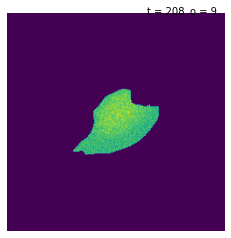

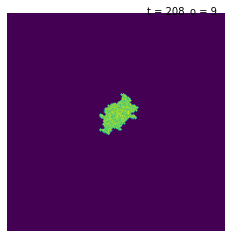

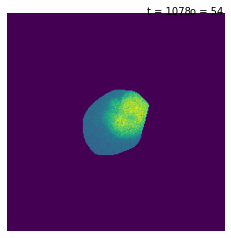

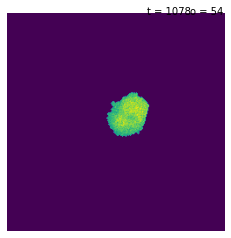

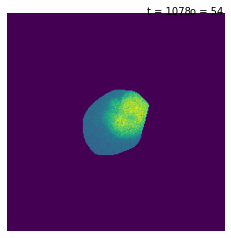

...

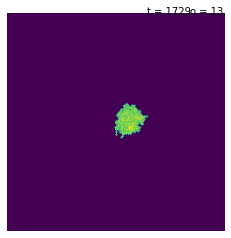

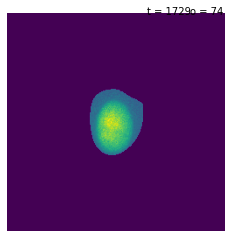

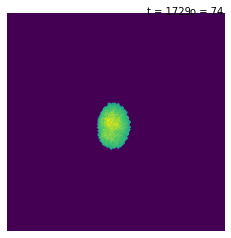

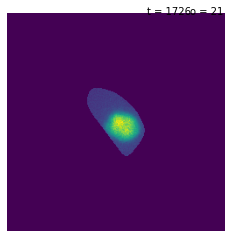

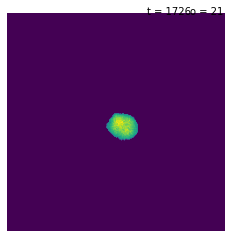

In [5]:
for posi in range(1,posi_end+1):
    posi_label = 'XY' + str(posi)
    print(posi_label)
    
    dir_path=output_path+posi_label+'/'
    fluor_img_path=main_path+'ori/'+posi_label+'_C2/'
    fluor_img_list=sorted(listdir(fluor_img_path))
    seg_path=output_path+posi_label+'/seg/'
    seg_list=sorted(listdir(seg_path))
        
    df=pd.read_csv(dir_path+'Per_Object_relink.csv')
    am_record=pd.read_csv(dir_path+'am_record.csv')
    traj_df=pd.read_csv(dir_path+'traj_object_num.csv')
    mitosis_df=pd.read_csv(dir_path+'mitosis_record.csv')
    with open (dir_path+'cells/'+'fluor_cells', 'rb') as fp:
        cells = pickle.load(fp)

    traj_record=pd.DataFrame(traj_df.loc[:,'1':str(time_span)])
    traj_record=traj_record.values
    traj_quan,traj_len=traj_record.shape[0],traj_record.shape[1]

    for traj_label in range(1,traj_quan+1):

        family_tree={}
        family_tree=find_offspring(df,mitosis_df,family_tree,traj_label=traj_label)
        print('family',family_tree)
        all_branches=list(list(parse(traj_label, family_tree)))
        print('all branch',all_branches)

        for branch in all_branches:   
            branch_end_label=branch[-1]
            branch_end_traj=traj_record[branch_end_label-1,:]
            branch_end_t=np.where(branch_end_traj!=-1)[0][-1]+1

            long_traj=-1*np.ones((time_span,))
            divide_points=[]
            traj_name=''
            for sub_label in branch:
                sub_traj=traj_record[sub_label-1,:]
                mask=sub_traj!=-1
                if (np.where(sub_traj!=-1)[0][-1]+1)!=branch_end_t:
                    divide_points.append(np.where(sub_traj!=-1)[0][-1]+1)
                long_traj[mask]=sub_traj[mask]
                traj_name=traj_name+str(sub_label)+'_' 
            
            daughter_flag=find_mother(mitosis_df,traj_label)
            mother_len = 0
            mother_len_thres = 12
            if daughter_flag==1:
                mother_label=find_mother_label(mitosis_df,traj_label)
                mother_traj=traj_record[mother_label-1,:]
                mother_start_t=np.where(mother_traj!=-1)[0][0]+1
                mother_end_t=np.where(mother_traj!=-1)[0][-1]+1
                mother_len=mother_end_t-mother_start_t
                    
                if mother_len >= mother_len_thres:
                    long_traj[mother_end_t-mother_len_thres:mother_end_t]=\
                        mother_traj[mother_end_t-mother_len_thres:mother_end_t]
                else:
                    mother_mask=mother_traj!=-1
                    long_traj[mother_mask]=mother_traj[mother_mask]
            traj_start_t=np.where(long_traj!=-1)[0][0]+1
                           
            whole_branch=long_traj[traj_start_t-1:branch_end_t]
            long_traj_loss_ratio=whole_branch[whole_branch==-1].shape[0]*1.0/whole_branch.shape[0]
            
            if long_traj_loss_ratio<loss_ratio_thres and (branch_end_t-traj_start_t)>=traj_len_thres:

                traj_feature,traj_contour,\
                    traj_cord,traj_seri,traj_am_flag,\
                    traj_vim_feature_values,traj_vim_pca_cord,\
                    traj_pcna_feature_values,traj_pcna_pca_cord=generate_fluor_long_traj(
                    df,cells,am_record,\
                    traj_df,long_traj,\
                    ['vimentin','pcna'],feature_list,fluor_feature_name)
                if len(traj_seri) >= 25:
                    traj_sct=fluor_single_cell_traj(traj_seri,traj_contour)
                    traj_sct.set_traj_feature(traj_feature)
                    traj_sct.set_traj_cord(traj_cord)
                    traj_sct.set_traj_divide_points(np.array(divide_points))
                    traj_sct.set_traj_am_flag(traj_am_flag)

                    traj_sct.set_traj_fluor_features('vimentin',feature_list,traj_vim_feature_values)
                    traj_sct.set_traj_fluor_pca_cord(fluor_feature_name[0],traj_vim_pca_cord)

                    traj_sct.set_traj_fluor_features('pcna',feature_list,traj_pcna_feature_values)
                    traj_sct.set_traj_fluor_pca_cord(fluor_feature_name[1],traj_pcna_pca_cord)

                    if branch_end_label==traj_label:
                        with open(sct_path+'fluor_sct_'+posi_label+'_'+traj_name+'long_traj', 'wb') as fp:
                            pickle.dump(traj_sct, fp)
                            
                        board_size=250

                        fig=plt.figure()
                        ax = fig.add_subplot(111)
                        ims=[]
                        for img_num,obj_num in traj_seri[traj_pcna_feature_values[0]>0]:
                            img_num=img_num.astype(np.int)
                            obj_num=obj_num.astype(np.int)
                            if obj_num!=-1:
                                img=imread(fluor_img_path+fluor_img_list[img_num-1])
                                seg_img=imread(seg_path+seg_list[img_num-1])
                                crop_cell,crop_cell_env=generate_single_cell_img(img,seg_img,img_num,obj_num)
                                x_c,y_c=crop_cell.shape[0]//2,crop_cell.shape[1]//2
                                x_l,y_l=board_size//2-x_c,board_size//2-y_c
                                cell_on_board=np.zeros((board_size,board_size))
                                cell_on_board[x_l:x_l+crop_cell.shape[0],y_l:y_l+crop_cell.shape[1]]=crop_cell
                                plt.axis('off')
                                im=plt.imshow(cell_on_board,animated=True)
                                t = ax.annotate('t = ' + str(img_num),(160,1))
                                o = ax.annotate('o = ' + str(obj_num),(210,1))
                                ims.append([im,t,o])

                        ani = animation.ArtistAnimation(fig, ims)
                        Writer = animation.writers['ffmpeg']
                        writer = Writer(fps=3, metadata=dict(artist='Thomas'), bitrate=-1)
                        ani.save(cell_ani_path+'pcna_sct_'+posi_label+'_'+traj_name+'long_traj.mp4',writer)

                        fig=plt.figure()
                        ax = fig.add_subplot(111)
                        ims=[]
                        for img_num,obj_num in traj_seri[traj_pcna_feature_values[0]>0]:

                            img_num=img_num.astype(np.int)
                            obj_num=obj_num.astype(np.int)

                            img=imread(fluor_img_path+fluor_img_list[img_num-1])
                            seg=imread(seg_path+seg_list[img_num-1])

                            if obj_num!=-1:

                                rps=regionprops(seg)
                                candi_r=[r for r in rps if r.label==obj_num][0]
                                candi_box=candi_r.bbox

                                cell_mask = (seg == obj_num)
                                region_cell_mask = cell_mask[candi_box[0]:candi_box[2], candi_box[1]:candi_box[3]]
                                crop_img = img[candi_box[0]:candi_box[2], candi_box[1]:candi_box[3]]
                                cell_img = (img*cell_mask)[candi_box[0]:candi_box[2],candi_box[1]:candi_box[3]]

                                nuc_mask=cell_img>otsu(cell_img,selem=disk(max(cell_img.shape)/2), mask=cell_img>0)
                                nuc_mask=remove_small_objects(opening(nuc_mask),100)
                                nuc_mask=closing(nuc_mask)
                                nuc_mask=remove_small_holes(nuc_mask,100)

                                nuc_img=cell_img*nuc_mask

                                x_c,y_c=nuc_img.shape[0]//2,nuc_img.shape[1]//2
                                x_l,y_l=board_size//2-x_c,board_size//2-y_c
                                cell_on_board=np.zeros((board_size,board_size))
                                cell_on_board[x_l:x_l+nuc_img.shape[0],y_l:y_l+nuc_img.shape[1]]=nuc_img
                                plt.axis('off')
                                im=plt.imshow(cell_on_board,animated=True)
                                t = ax.annotate('t = ' + str(img_num),(160,1))
                                o = ax.annotate('o = ' + str(obj_num),(210,1))
                                ims.append([im,t,o])

        #                 ani = animation.ArtistAnimation(fig, ims)
                        ani = animation.ArtistAnimation(fig, ims)
                        Writer = animation.writers['ffmpeg']
                        writer = Writer(fps=3, metadata=dict(artist='Thomas'), bitrate=-1)
                        ani.save(cell_nuc_ani_path+'pcna_sct_'+posi_label+'_'+traj_name+'long_traj.mp4',writer)
                        
                    else:
                        with open(sct_path+'indirect_fluor_sct_'+posi_label+'_'+traj_name+'long_traj', 'wb') as fp:
                            pickle.dump(traj_sct, fp)


                        board_size=250

                        fig=plt.figure()
                        ax = fig.add_subplot(111)
                        ims=[]
                        for img_num,obj_num in traj_seri[traj_pcna_feature_values[0]>0]:
                            img_num=img_num.astype(np.int)
                            obj_num=obj_num.astype(np.int)
                            if obj_num!=-1:
                                img=imread(fluor_img_path+fluor_img_list[img_num-1])
                                seg_img=imread(seg_path+seg_list[img_num-1])
                                crop_cell,crop_cell_env=generate_single_cell_img(img,seg_img,img_num,obj_num)
                                x_c,y_c=crop_cell.shape[0]//2,crop_cell.shape[1]//2
                                x_l,y_l=board_size//2-x_c,board_size//2-y_c
                                cell_on_board=np.zeros((board_size,board_size))
                                cell_on_board[x_l:x_l+crop_cell.shape[0],y_l:y_l+crop_cell.shape[1]]=crop_cell
                                plt.axis('off')
                                im=plt.imshow(cell_on_board,animated=True)
                                t = ax.annotate('t = ' + str(img_num),(160,1))
                                o = ax.annotate('o = ' + str(obj_num),(210,1))
                                ims.append([im,t,o])

                        ani = animation.ArtistAnimation(fig, ims)
                        Writer = animation.writers['ffmpeg']
                        writer = Writer(fps=3, metadata=dict(artist='Thomas'), bitrate=-1)
                        ani.save(cell_ani_path+'indirect_pcna_sct_'+posi_label+'_'+traj_name+'long_traj.mp4',writer)

                        fig=plt.figure()
                        ax = fig.add_subplot(111)
                        ims=[]
                        for img_num,obj_num in traj_seri[traj_pcna_feature_values[0]>0]:

                            img_num=img_num.astype(np.int)
                            obj_num=obj_num.astype(np.int)

                            img=imread(fluor_img_path+fluor_img_list[img_num-1])
                            seg=imread(seg_path+seg_list[img_num-1])

                            if obj_num!=-1:

                                rps=regionprops(seg)
                                candi_r=[r for r in rps if r.label==obj_num][0]
                                candi_box=candi_r.bbox

                                cell_mask = (seg == obj_num)
                                region_cell_mask = cell_mask[candi_box[0]:candi_box[2], candi_box[1]:candi_box[3]]
                                crop_img = img[candi_box[0]:candi_box[2], candi_box[1]:candi_box[3]]
                                cell_img = (img*cell_mask)[candi_box[0]:candi_box[2],candi_box[1]:candi_box[3]]

                                nuc_mask=cell_img>otsu(cell_img,selem=disk(max(cell_img.shape)/2), mask=cell_img>0)
                                nuc_mask=remove_small_objects(opening(nuc_mask),100)
                                nuc_mask=closing(nuc_mask)
                                nuc_mask=remove_small_holes(nuc_mask,100)

                                nuc_img=cell_img*nuc_mask

                                x_c,y_c=nuc_img.shape[0]//2,nuc_img.shape[1]//2
                                x_l,y_l=board_size//2-x_c,board_size//2-y_c
                                cell_on_board=np.zeros((board_size,board_size))
                                cell_on_board[x_l:x_l+nuc_img.shape[0],y_l:y_l+nuc_img.shape[1]]=nuc_img
                                plt.axis('off')
                                im=plt.imshow(cell_on_board,animated=True)
                                t = ax.annotate('t = ' + str(img_num),(160,1))
                                o = ax.annotate('o = ' + str(obj_num),(210,1))
                                ims.append([im,t,o])

        #                 ani = animation.ArtistAnimation(fig, ims)
                        ani = animation.ArtistAnimation(fig, ims)
                        Writer = animation.writers['ffmpeg']
                        writer = Writer(fps=3, metadata=dict(artist='Thomas'), bitrate=-1)
                        ani.save(cell_nuc_ani_path+'indirect_pcna_sct_'+posi_label+'_'+traj_name+'long_traj.mp4',writer)